In [1]:
import os
import pickle
from pathlib import Path
import functools

import numpy as np
from scipy import stats as st
from sklearn.feature_selection import mutual_info_regression as MI

import plotly.graph_objects as go
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()

import sys
sys.path.append('/home/leonardo/git/bayesian_bss')
from src import MAPGradientAscentEstimator, MMSEMetropolisHastingsEstimator, PosteriorContourLines, ContourLineGraphPlotter, MCMCGraphPlotter

np.random.seed(2000)

In [2]:
# Whether or not to create folder structure
CREATE_FOLDER_STRUCTURE=True

# Whether or not to save graphs
SAVE_GRAPHS=True

# Whether or not to save source and mixture signals
SAVE_SIGNALS=True

# Whether or not to calculate grid
CALCULATE_GRID = True

# Whether or not to execute sampling
EXECUTE_SAMPLING=True

# Number of sources and observations
NSOURCES=2
NOBS=1000

# Execution hyperparameters
N_WORKERS = os.cpu_count()

# Number of points used in contour line grids
CONTOUR_GRID_POINTS=21

# Mixing matrix configuration
A = np.array([
    [1, 1],
    [-0.5, 0.5]
])

# MCMC configs
EXPLORATION_VAR=1E-4
N_SAMPLES=20000//10
BURN_IN=0.5

# Plot configs
NBINS=251//10

# Learning rate
learning_rate=1E-3

# Optimization configs
thresh = 0.0005
max_it=100000

# Variável para armazenar erros de estimação em cada caso
errors = {
    'perfect_model': {},
    'slightly_misspecified_model': {},
    'largely_misspecified_model': {}
}

In [3]:
# Folder which will contain output directory tree
OUTPUT_DIR='./output'
base_output_path=Path(OUTPUT_DIR)

# Experiment params
EXPERIMENT_NAME='nobs_1k'
EXPERIMENT_DESCRIPTION="""
    Runs perfect model, slightly misspecified model and largely misspecified model with 1k observations and 20k Metropolis-Hastings steps.
"""

# Create experiment directory tree, if so specified
experiment_dir = base_output_path / EXPERIMENT_NAME
perfect_model_dir = experiment_dir / 'perfect_model'
slightly_misspecified_model_dir = experiment_dir / 'slightly_misspecified_model'
largely_misspecified_model_dir = experiment_dir / 'largely_misspecified_model'
if CREATE_FOLDER_STRUCTURE:
    if not experiment_dir.is_dir():
        experiment_dir.mkdir()
    if not perfect_model_dir.is_dir():
        perfect_model_dir.mkdir()
    if not slightly_misspecified_model_dir.is_dir():
        slightly_misspecified_model_dir.mkdir()
    if not largely_misspecified_model_dir.is_dir():
        largely_misspecified_model_dir.mkdir()

# Write experiment description
if CALCULATE_GRID:
    with (experiment_dir/'experiment_description.txt').open('w') as f:
        f.write(EXPERIMENT_DESCRIPTION)

# ENSAIO - CURVAS DE DESEMPENHO MAP

#### Objetivos:
#### - Verificar o efeito da especificação da distribuição a priori bayesiana (boa ou ruim) sobre ponto de convergência de estimação de matriz de separação;
#### - Verificar o efeito da especificação da distribuição das fontes (boa ou ruim) sobre ponto de convergência de estimação de matriz de separação;

#### Para tal:
####  - Constroem-se gráficos da vizinhança estimada do ponto ótimo (verdadeiro), seguindo exercício feito em Cardoso (1998)
####  - Realizam-se otimizações com o objetivo de determinar a matriz de separação, simulando um cenário de separação de fontes. Nas otimizações, a condição inicial é colocada próxima à verdadeira, para que, a partir de uma convergência facilitada, possa ser determinado o ponto global de máximo nos vários cenários testados.

# Função a ser otimizada (probabilidade a posteriori)

#### De Djafari, 2000
$$ \log P(\boldsymbol{B}|y) = T \log |det({B})| + \sum_{t} \sum_{i} \log p_{i}(y_{i}(t)) + \log P(\boldsymbol{B}) + cte$$

# Equação de otimização (derivada)

#### De Taylor, 2008
$$ \Delta \boldsymbol{B} \varpropto (\boldsymbol{B}^{-1})^{T} + \frac{1}{T} \sum_{T} g(\boldsymbol{Bx}) \boldsymbol{x}^{T} + \frac{1}{T} h(\boldsymbol{B})$$

In [4]:
def log_posteriori_fn(
    x,
    source_pdf_fn,
    prior_pdf_fn,
    B
):
    NOBS=x.shape[-1]
    
    # Cálculo de posteriori para registros
    posteriori = NOBS*np.log(np.abs(np.linalg.det(B)))
    y=B@x
    for i, j in np.ndindex(x.shape):
        posteriori += np.log(source_pdf(y[i,j]))
    posteriori += np.log(prior_pdf(B))

    return posteriori

def proposal_fn(
    exploration_var,
    B
):
    # Calculate shift in parameter
    shift = np.random.normal(
        loc=0,
        scale=np.sqrt(exploration_var),
        size=B.shape
    )

    # Sum shift to obtain new parameter value
    new_B = np.add(
        B, shift
    )

    return new_B

# 1. PERFECT MODEL

In [5]:
model_dir = perfect_model_dir

## 1.1. Initialize Sources

In [6]:
def source_cumulative(x):
    return 1/(1+np.exp(-x))

def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def source_generator(
    nsources,
    nobs,
    mu
):
    return np.random.logistic(
        loc=mu,
        scale=1,
        size=(nsources, nobs)
    )

In [7]:
MU=0.0

s = source_generator(
    nsources=NSOURCES,
    nobs=NOBS,
    mu=MU
)

print('-'*100)
print('NÚMERO DE FONTES: {}'.format(NSOURCES))
print('TAMANHO DOS SINAIS DAS FONTES: {}'.format(NOBS))
for i in range(s.shape[0]):
    print(
        'CURTOSE s{}: {}'.format(
            i,
            st.kurtosis(a=s[i,:])
        )
    )
    
print('-'*100)

----------------------------------------------------------------------------------------------------
NÚMERO DE FONTES: 2
TAMANHO DOS SINAIS DAS FONTES: 1000
CURTOSE s0: 0.9943018680142313
CURTOSE s1: 1.063862246511789
----------------------------------------------------------------------------------------------------


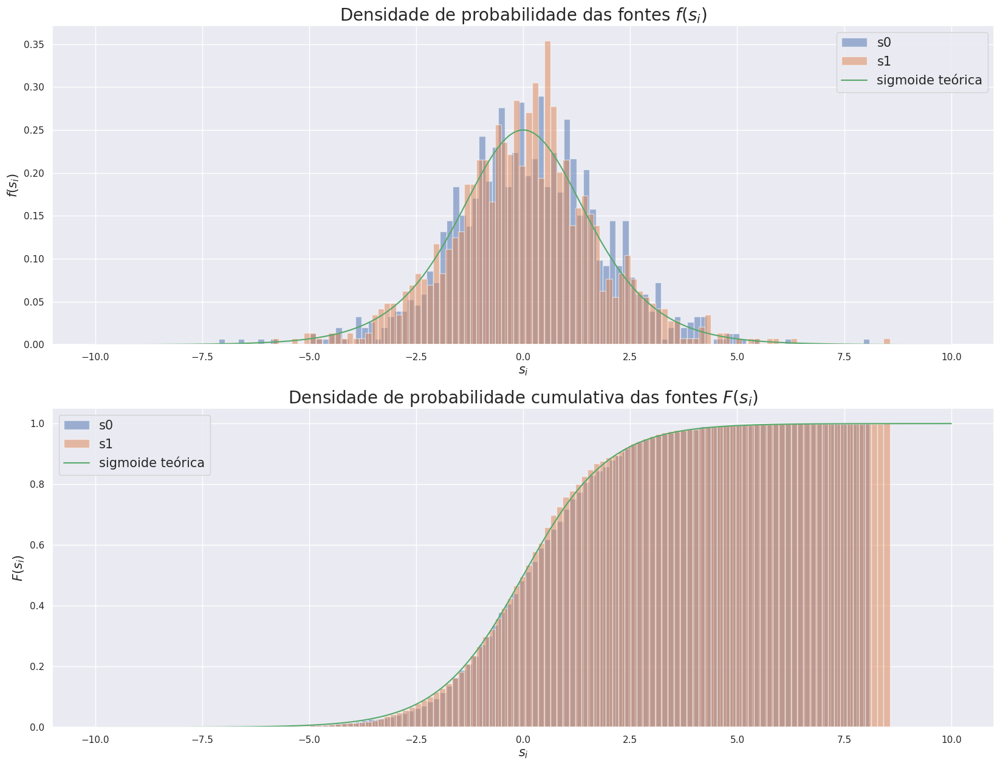

In [8]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)


for i in range(1, NSOURCES+1):
    ax1.hist(
        x=s[i-1,:],
        bins=100,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=s[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    
ax1.plot(
    np.linspace(-10,10,1000),
    [source_pdf(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)


ax2.plot(
    np.linspace(-10,10,1000),
    [source_cumulative(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)

ax1.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(s_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidade de probabilidade das fontes $f(s_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(s_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidade de probabilidade cumulativa das fontes $F(s_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 1.2. Mix sources and generate observations

In [9]:
# Mixing matrix
A = np.array([
    [1, 1],
    [-0.5, 0.5]
])
print('MIXING MATRIX A:')
print(A)

MIXING MATRIX A:
[[ 1.   1. ]
 [-0.5  0.5]]


In [10]:
initial_B = np.linalg.inv(
    A
) + np.random.normal(
    0,0.1,
    A.shape
)
initial_B = initial_B.reshape(
    (NSOURCES, NSOURCES, 1)
)

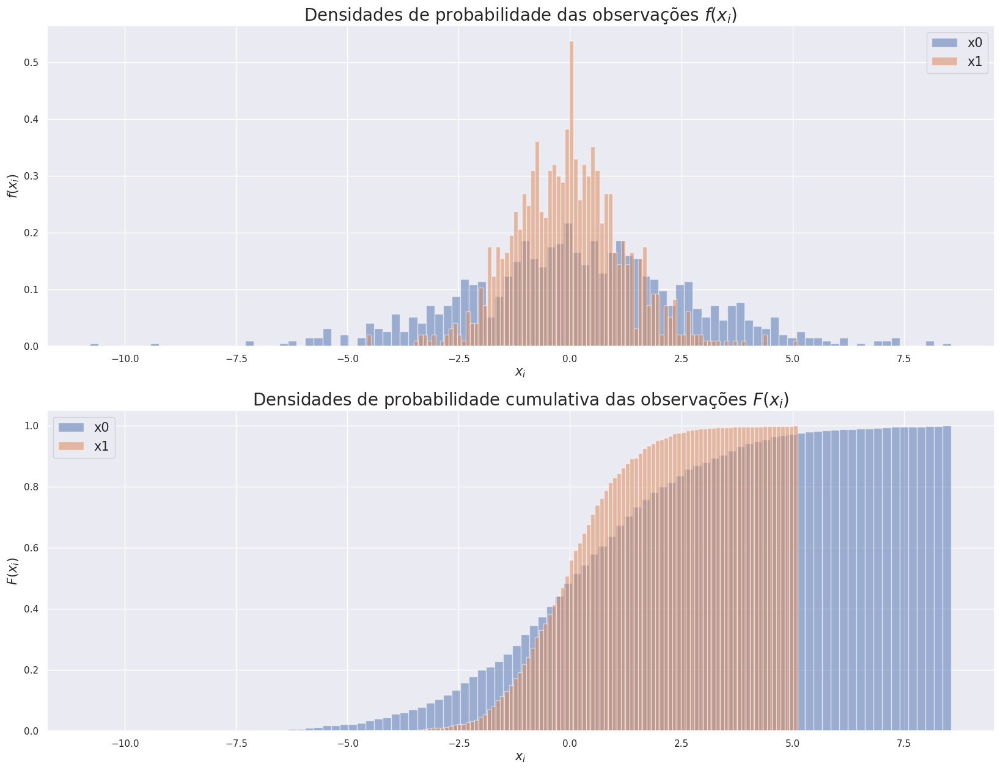

In [11]:
# Observed sources
x = A@s

fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)

for i in range(1, NSOURCES+1):
    ax1.hist(
        x=x[i-1,:],
        bins=100,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=x[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )

ax1.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(x_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidades de probabilidade das observações $f(x_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(x_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidades de probabilidade cumulativa das observações $F(x_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

In [12]:
if SAVE_SIGNALS:
    signal_save_dir = model_dir / 'signals'
    if not signal_save_dir.is_dir():
        signal_save_dir.mkdir()

    with (signal_save_dir / 'sources.pkl').open(mode='wb') as f:
        pickle.dump(s, f)

    with (signal_save_dir / 'mixtures.pkl').open(mode='wb') as f:
        pickle.dump(x, f)

## 1.3. Performance Curves - LIKELIHOOD

#### Prior:
#### $p(\boldsymbol{B})=cte$

In [13]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    return 1

## 1.3.1. Calculate Posteriori Grid

In [14]:
%%time

#############################
# CALCULATE POSTERIORI GRID #
#############################

# Create folder for combination of model specification + prior
combination_dir = model_dir / 'likelihood'
if CREATE_FOLDER_STRUCTURE:
    if not combination_dir.is_dir():
        combination_dir.mkdir()

if CALCULATE_GRID:
    # Initialize object used to obtain contour lines
    c_lines = PosteriorContourLines(
        u_lims=(-0.05, 0.05),
        v_lims=(-0.05, 0.05),
        n_points=CONTOUR_GRID_POINTS,
        central_point=(0,0)
    )
    
    # Evaluate posterior in neighborhood of true point
    c_lines.get_posteriori_neighborhood(
        A=A,
        x=x,
        N=NOBS,
        source_pdf_fn=source_pdf,
        prior_pdf_fn=prior_pdf,
        njobs=os.cpu_count()-1
    )
    
    # Maximum a posteriori point
    c_lines.get_max_point()

    # Save artifact
    with (combination_dir / 'ContourLines.pkl').open('wb') as f:
        pickle.dump(c_lines, f)
else:
    # Read artifact
    with (combination_dir / 'ContourLines.pkl').open('rb') as f:
        c_lines=pickle.load(f)

----------------------------------------------------------------------------------------------------
Ponto de máximo: u=-0.015, v=0.045
----------------------------------------------------------------------------------------------------
CPU times: user 177 ms, sys: 90 ms, total: 267 ms
Wall time: 1.77 s


## 1.3.2. Sample from Posterior Distribution

In [15]:
%%time

######################################
# SAMPLE FROM POSTERIOR DISTRIBUTION #
######################################

if EXECUTE_SAMPLING:
    # Fixate arguments in log posteriori fn
    wrapper_posteriori_fn = functools.partial(
        log_posteriori_fn,
        x,
        source_pdf,
        prior_pdf
    )
    
    # Fixate arguments in proposal_fn
    wrapper_proposal_fn = functools.partial(
        proposal_fn,
        EXPLORATION_VAR
    )
    
    # Initialize MH estimator
    estimator = MMSEMetropolisHastingsEstimator(
        n_samples=N_SAMPLES,
        log_posterior_fn=wrapper_posteriori_fn,
        Q=wrapper_proposal_fn,
        burn_in=BURN_IN
    )
    
    # Execute MCMC estimation
    estimator.fit(
        s,
        x,
        initial_condition=np.array([
            np.linalg.inv(A)
        ]).reshape((A.shape[0], A.shape[-1], 1)),
        n_jobs=N_WORKERS
    )

    # Save artifact
    with (combination_dir / 'MH_Estimator.pkl').open('wb') as f:
        pickle.dump(estimator, f)
else:
    # Read artifact
    with (combination_dir / 'MH_Estimator.pkl').open('rb') as f:
        estimator=pickle.load(f)

# 

CPU times: user 31 ms, sys: 106 ms, total: 137 ms
Wall time: 38.2 s


In [16]:
# Parse estimator object
analyzed_model_idx = 0
B_est = estimator.mcmc_results[analyzed_model_idx]['B_est']
s_est = B_est@x
samples = estimator.mcmc_results[analyzed_model_idx]['samples']
valid_samples = estimator.mcmc_results[analyzed_model_idx]['valid_samples']
logs = estimator.mcmc_results[analyzed_model_idx]['logs']

## 1.3.3. Plot 2D Contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (contour lines)
----------------------------------------------------------------------------------------------------


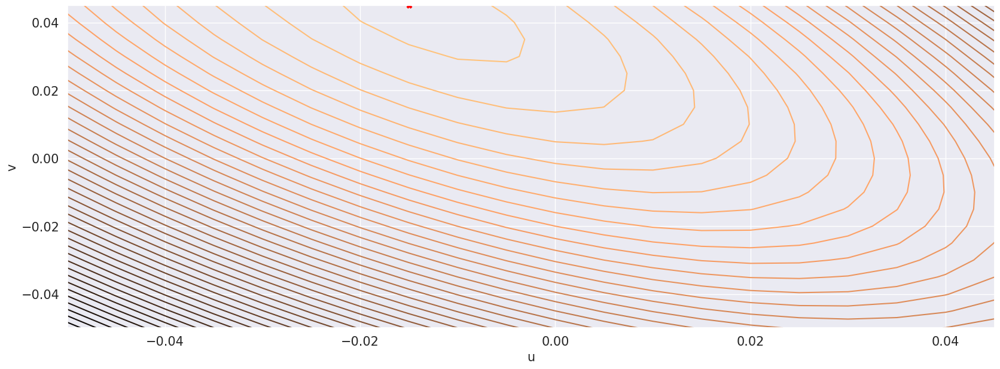

In [17]:
# 2-D Contour Lines
ContourLineGraphPlotter.plot_2D_contours(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid,
    max_post_point=c_lines.max_post_point
)

## 1.3.4. Plot interactive 3D

In [18]:
# 3-D Interactive plot
ContourLineGraphPlotter.plot_3D_interactive(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid
)

### 1.3.5. Plot sampled coefficients stochastic process - Markov Chain evolution

----------------------------------------------------------------------------------------------------
Evolution of sampled coefficients
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


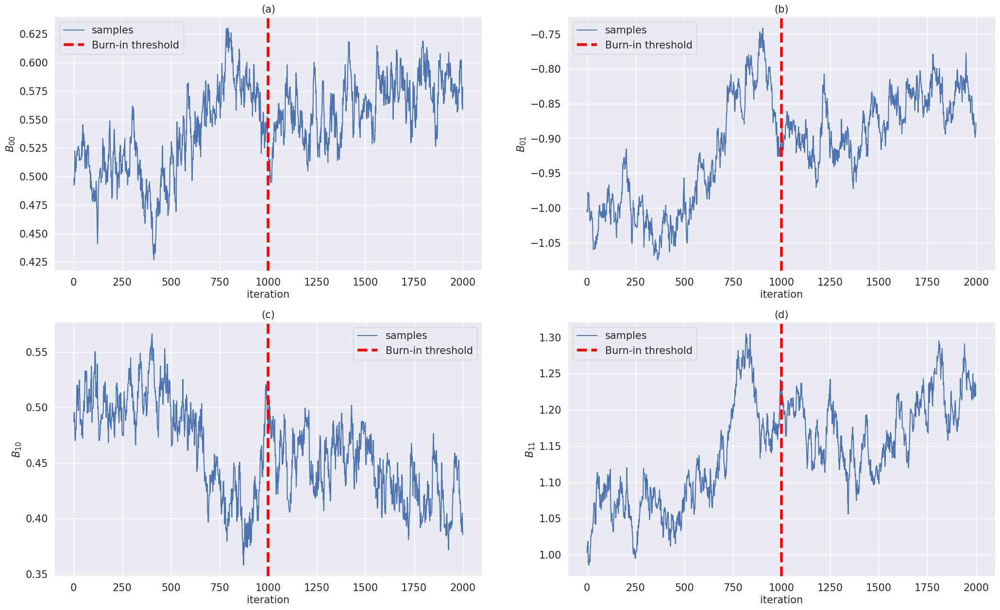

In [19]:
MCMCGraphPlotter.evolution_of_sampled_coefficients(
    samples=samples,
    estimator=estimator,
    logs=logs,
    save_dir=combination_dir if SAVE_GRAPHS else None
)

### 1.3.6. Plot Marginal Posteriors for Coefficients - Post-burn-in

----------------------------------------------------------------------------------------------------
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


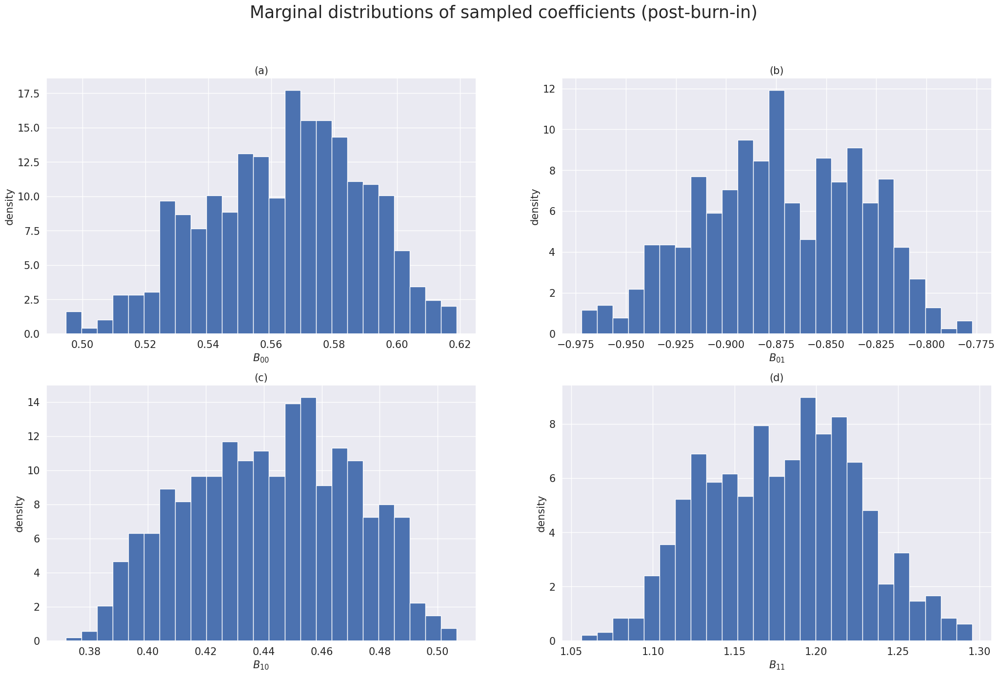

In [20]:
MCMCGraphPlotter.steady_state_marginal_distributions(
    valid_samples=valid_samples,
    nbins=NBINS,
    B_est=B_est,
    save_dir=combination_dir if SAVE_GRAPHS else None,
    plot_estimate=False
)

## 1.4. Performance Curves - determinant prior
#### Prior:
#### $p(\boldsymbol{B}) \varpropto \exp \left[ -\frac{1}{2 \sigma^{2}} (det(\boldsymbol{B}) - 1)^2 \right]$

In [21]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

In [22]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

def log_posteriori_fn(
    x,
    source_pdf_fn,
    prior_pdf_fn,
    B
):
    NOBS=x.shape[-1]
    
    # Cálculo de posteriori para registros
    posteriori = NOBS*np.log(np.abs(np.linalg.det(B)))
    y=B@x
    for i, j in np.ndindex(x.shape):
        posteriori += np.log(source_pdf(y[i,j]))
    posteriori += np.log(prior_pdf(B))

    return posteriori

def proposal_fn(
    exploration_var,
    B
):
    # Calculate shift in parameter
    shift = np.random.normal(
        loc=0,
        scale=np.sqrt(exploration_var),
        size=B.shape
    )

    # Sum shift to obtain new parameter value
    new_B = np.add(
        B, shift
    )

    return new_B

### 1.4.1. Calculate Posteriori Grid

In [23]:
%%time

#############################
# CALCULATE POSTERIORI GRID #
#############################

# Create folder for combination of model specification + prior
combination_dir = model_dir / 'determinant_prior'
if CREATE_FOLDER_STRUCTURE:
    if not combination_dir.is_dir():
        combination_dir.mkdir()

if CALCULATE_GRID:
    # Initialize object used to obtain contour lines
    c_lines = PosteriorContourLines(
        u_lims=(-0.05, 0.05),
        v_lims=(-0.05, 0.05),
        n_points=CONTOUR_GRID_POINTS,
        central_point=(0,0)
    )
    
    # Evaluate posterior in neighborhood of true point
    c_lines.get_posteriori_neighborhood(
        A=A,
        x=x,
        N=NOBS,
        source_pdf_fn=source_pdf,
        prior_pdf_fn=prior_pdf,
        njobs=os.cpu_count()-1
    )
    
    # Maximum a posteriori point
    c_lines.get_max_point()

    # Save artifact
    with (combination_dir / 'ContourLines.pkl').open('wb') as f:
        pickle.dump(c_lines, f)
else:
    # Read artifact
    with (combination_dir / 'ContourLines.pkl').open('rb') as f:
        c_lines=pickle.load(f)

----------------------------------------------------------------------------------------------------
Ponto de máximo: u=-0.01, v=0.035
----------------------------------------------------------------------------------------------------
CPU times: user 136 ms, sys: 5.92 ms, total: 142 ms
Wall time: 1.36 s


### 1.4.2. Sample from Posterior Distribution

In [24]:
%%time

######################################
# SAMPLE FROM POSTERIOR DISTRIBUTION #
######################################

if EXECUTE_SAMPLING:
    # Fixate arguments in log posteriori fn
    wrapper_posteriori_fn = functools.partial(
        log_posteriori_fn,
        x,
        source_pdf,
        prior_pdf
    )
    
    # Fixate arguments in proposal_fn
    wrapper_proposal_fn = functools.partial(
        proposal_fn,
        EXPLORATION_VAR
    )
    
    # Initialize MH estimator
    estimator = MMSEMetropolisHastingsEstimator(
        n_samples=N_SAMPLES,
        log_posterior_fn=wrapper_posteriori_fn,
        Q=wrapper_proposal_fn,
        burn_in=BURN_IN
    )
    
    # Execute MCMC estimation
    estimator.fit(
        s,
        x,
        initial_condition=np.array([
            np.linalg.inv(A)
        ]).reshape((A.shape[0], A.shape[-1], 1)),
        n_jobs=N_WORKERS
    )

    # Save artifact
    with (combination_dir / 'MH_Estimator.pkl').open('wb') as f:
        pickle.dump(estimator, f)
else:
    # Read artifact
    with (combination_dir / 'MH_Estimator.pkl').open('rb') as f:
        estimator=pickle.load(f)

# 

CPU times: user 54.3 ms, sys: 56.3 ms, total: 111 ms
Wall time: 41.4 s


In [25]:
# Parse estimator object
analyzed_model_idx = 0
B_est = estimator.mcmc_results[analyzed_model_idx]['B_est']
s_est = B_est@x
samples = estimator.mcmc_results[analyzed_model_idx]['samples']
valid_samples = estimator.mcmc_results[analyzed_model_idx]['valid_samples']
logs = estimator.mcmc_results[analyzed_model_idx]['logs']

### 1.4.3. Plot 2D Contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (contour lines)
----------------------------------------------------------------------------------------------------


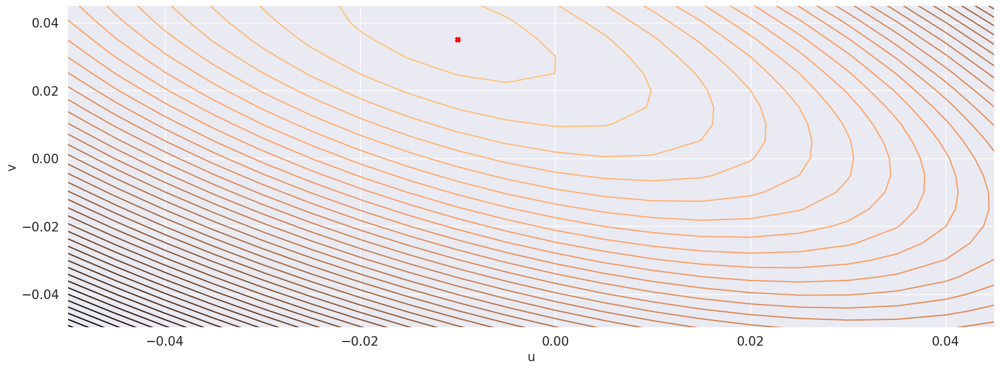

In [26]:
# 2-D Contour Lines
ContourLineGraphPlotter.plot_2D_contours(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid,
    max_post_point=c_lines.max_post_point
)

### 1.4.4. Plot interactive 3D

In [27]:
# 3-D Interactive plot
ContourLineGraphPlotter.plot_3D_interactive(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid
)

### 1.4.5. Plot sampled coefficients stochastic process - Markov Chain evolution

----------------------------------------------------------------------------------------------------
Evolution of sampled coefficients
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


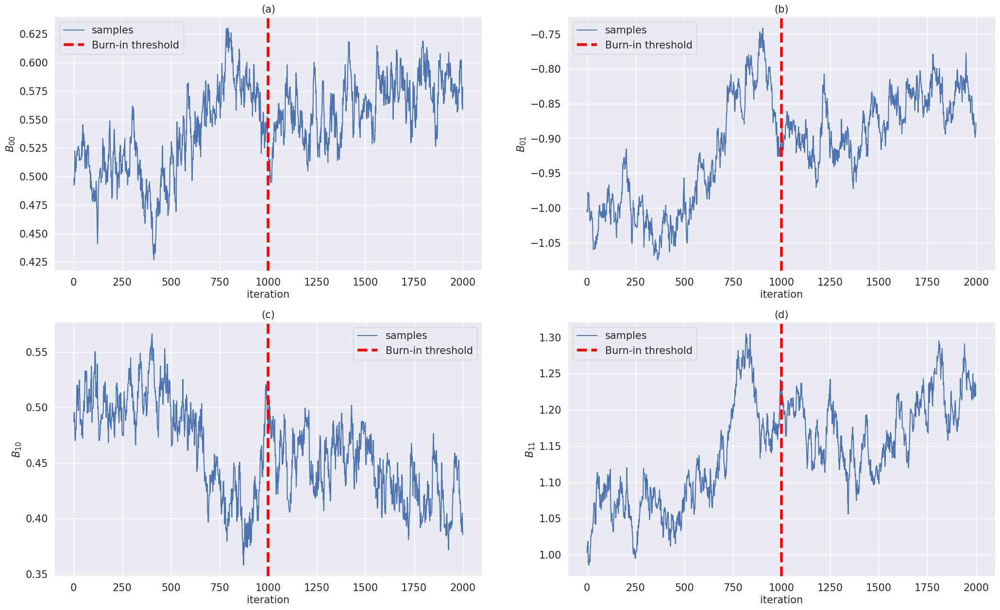

In [28]:
MCMCGraphPlotter.evolution_of_sampled_coefficients(
    samples=samples,
    estimator=estimator,
    logs=logs,
    save_dir=combination_dir if SAVE_GRAPHS else None
)

### 1.4.6. Plot Marginal Posteriors for Coefficients - Post-burn-in

----------------------------------------------------------------------------------------------------
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


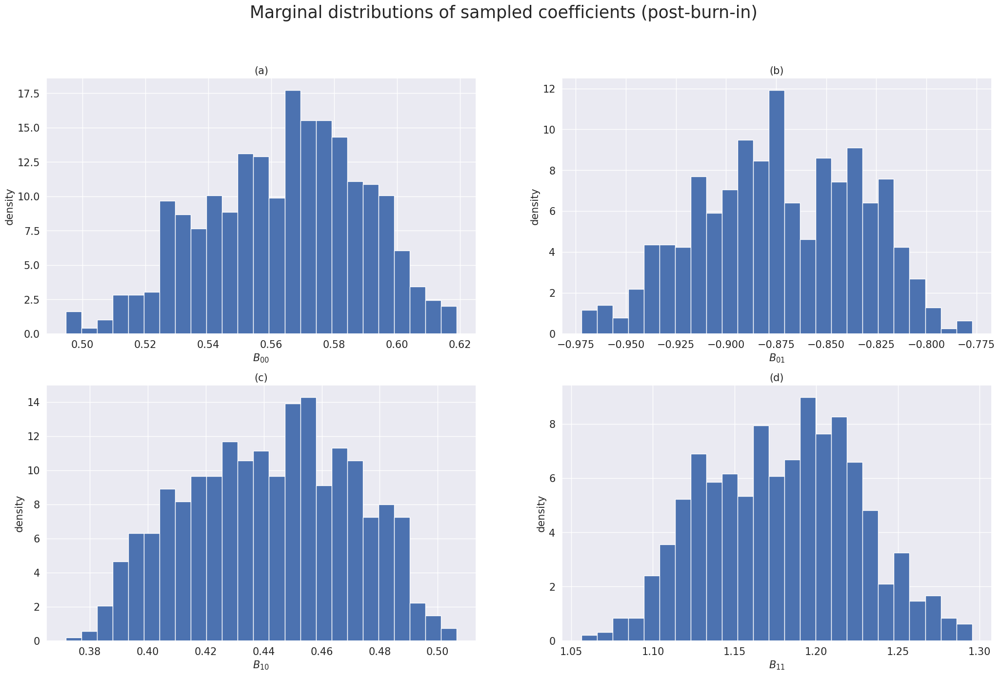

In [29]:
MCMCGraphPlotter.steady_state_marginal_distributions(
    valid_samples=valid_samples,
    nbins=NBINS,
    B_est=B_est,
    save_dir=combination_dir if SAVE_GRAPHS else None,
    plot_estimate=False
)

## 1.5. MAP - near-identity transformation
#### Prior:
#### $p(\boldsymbol{B}) \varpropto \exp \left[ -\frac{1}{2 \sigma^{2}} ||\boldsymbol{B} - \boldsymbol{I}||^2 \right]$

In [30]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(X):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.linalg.norm(X-np.eye(X.shape[0]))
    )

### 1.5.1. Calculate Posteriori Grid

In [31]:
%%time

#############################
# CALCULATE POSTERIORI GRID #
#############################

# Create folder for combination of model specification + prior
combination_dir = model_dir / 'identity_transform'
if CREATE_FOLDER_STRUCTURE:
    if not combination_dir.is_dir():
        combination_dir.mkdir()

if CALCULATE_GRID:
    # Initialize object used to obtain contour lines
    c_lines = PosteriorContourLines(
        u_lims=(-0.05, 0.05),
        v_lims=(-0.05, 0.05),
        n_points=CONTOUR_GRID_POINTS,
        central_point=(0,0)
    )
    
    # Evaluate posterior in neighborhood of true point
    c_lines.get_posteriori_neighborhood(
        A=A,
        x=x,
        N=NOBS,
        source_pdf_fn=source_pdf,
        prior_pdf_fn=prior_pdf,
        njobs=os.cpu_count()-1
    )
    
    # Maximum a posteriori point
    c_lines.get_max_point()

    # Save artifact
    with (combination_dir / 'ContourLines.pkl').open('wb') as f:
        pickle.dump(c_lines, f)
else:
    # Read artifact
    with (combination_dir / 'ContourLines.pkl').open('rb') as f:
        c_lines=pickle.load(f)

----------------------------------------------------------------------------------------------------
Ponto de máximo: u=-0.025, v=0.045
----------------------------------------------------------------------------------------------------
CPU times: user 163 ms, sys: 8.18 ms, total: 171 ms
Wall time: 1.53 s


### 1.5.2. Sample from Posterior Distribution

In [32]:
%%time

######################################
# SAMPLE FROM POSTERIOR DISTRIBUTION #
######################################

if EXECUTE_SAMPLING:
    # Fixate arguments in log posteriori fn
    wrapper_posteriori_fn = functools.partial(
        log_posteriori_fn,
        x,
        source_pdf,
        prior_pdf
    )
    
    # Fixate arguments in proposal_fn
    wrapper_proposal_fn = functools.partial(
        proposal_fn,
        EXPLORATION_VAR
    )
    
    # Initialize MH estimator
    estimator = MMSEMetropolisHastingsEstimator(
        n_samples=N_SAMPLES,
        log_posterior_fn=wrapper_posteriori_fn,
        Q=wrapper_proposal_fn,
        burn_in=BURN_IN
    )
    
    # Execute MCMC estimation
    estimator.fit(
        s,
        x,
        initial_condition=np.array([
            np.linalg.inv(A)
        ]).reshape((A.shape[0], A.shape[-1], 1)),
        n_jobs=N_WORKERS
    )

    # Save artifact
    with (combination_dir / 'MH_Estimator.pkl').open('wb') as f:
        pickle.dump(estimator, f)
else:
    # Read artifact
    with (combination_dir / 'MH_Estimator.pkl').open('rb') as f:
        estimator=pickle.load(f)

# 

CPU times: user 44.3 ms, sys: 65 ms, total: 109 ms
Wall time: 39.1 s


In [33]:
# Parse estimator object
analyzed_model_idx = 0
B_est = estimator.mcmc_results[analyzed_model_idx]['B_est']
s_est = B_est@x
samples = estimator.mcmc_results[analyzed_model_idx]['samples']
valid_samples = estimator.mcmc_results[analyzed_model_idx]['valid_samples']
logs = estimator.mcmc_results[analyzed_model_idx]['logs']

### 1.5.3. Plot 2D Contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (contour lines)
----------------------------------------------------------------------------------------------------


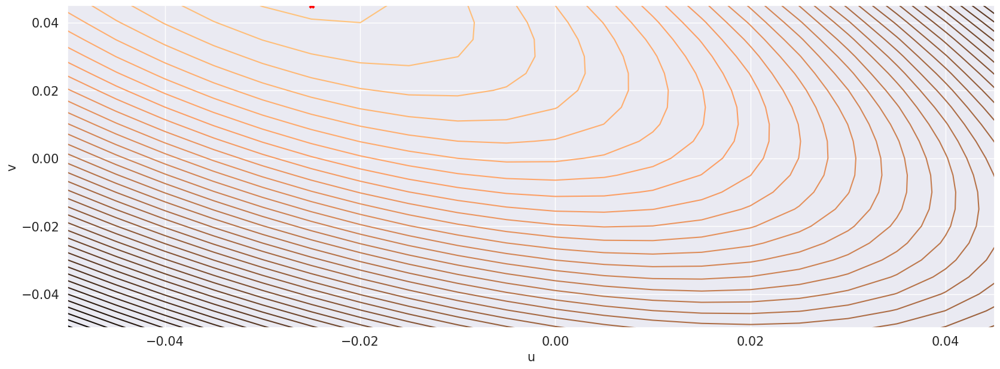

In [34]:
# 2-D Contour Lines
ContourLineGraphPlotter.plot_2D_contours(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid,
    max_post_point=c_lines.max_post_point
)

### 1.5.4. Plot interactive 3D

In [35]:
# 3-D Interactive plot
ContourLineGraphPlotter.plot_3D_interactive(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid
)

### 1.5.5. Plot sampled coefficients stochastic process - Markov Chain evolution

----------------------------------------------------------------------------------------------------
Evolution of sampled coefficients
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


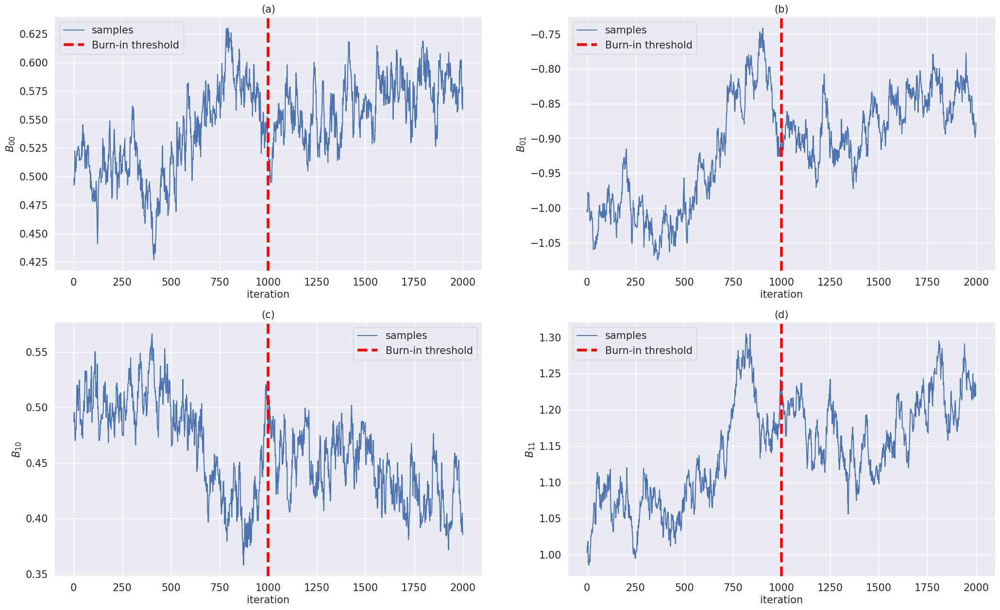

In [36]:
MCMCGraphPlotter.evolution_of_sampled_coefficients(
    samples=samples,
    estimator=estimator,
    logs=logs,
    save_dir=combination_dir if SAVE_GRAPHS else None
)

### 1.5.6. Plot Marginal Posteriors for Coefficients - Post-burn-in

----------------------------------------------------------------------------------------------------
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


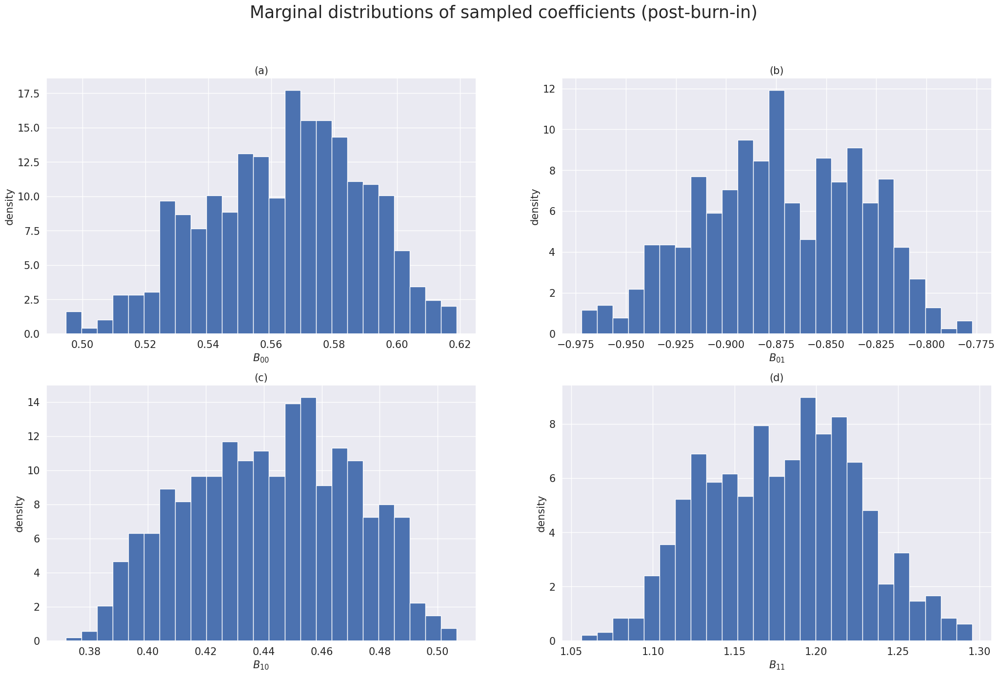

In [37]:
MCMCGraphPlotter.steady_state_marginal_distributions(
    valid_samples=valid_samples,
    nbins=NBINS,
    B_est=B_est,
    save_dir=combination_dir if SAVE_GRAPHS else None,
    plot_estimate=False
)

In [38]:
PAROU POURA

SyntaxError: invalid syntax (3395508541.py, line 1)

# 2. SLIGHTLY MISSPECIFIED MODEL

In [47]:
model_dir = slightly_misspecified_model_dir

## 2.1. Initialize Sources

In [39]:
def source_cumulative(x):
    return 1/(1+np.exp(-x))

def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def source_generator(
    nsources,
    nobs,
    mu,
    scale
):
    return np.random.logistic(
        loc=mu,
        scale=scale,
        size=(nsources, nobs)
    )

In [40]:
MU=0.1
SCALE=1.1

s = source_generator(
    nsources=NSOURCES,
    nobs=NOBS,
    mu=MU,
    scale=SCALE
)

print('-'*100)
print('NÚMERO DE FONTES: {}'.format(NSOURCES))
print('TAMANHO DOS SINAIS DAS FONTES: {}'.format(NOBS))
for i in range(s.shape[0]):
    print(
        'CURTOSE s{}: {}'.format(
            i,
            st.kurtosis(a=s[i,:])
        )
    )
    
print('-'*100)

----------------------------------------------------------------------------------------------------
NÚMERO DE FONTES: 2
TAMANHO DOS SINAIS DAS FONTES: 1000
CURTOSE s0: 0.7195856193810508
CURTOSE s1: 1.122679296319518
----------------------------------------------------------------------------------------------------


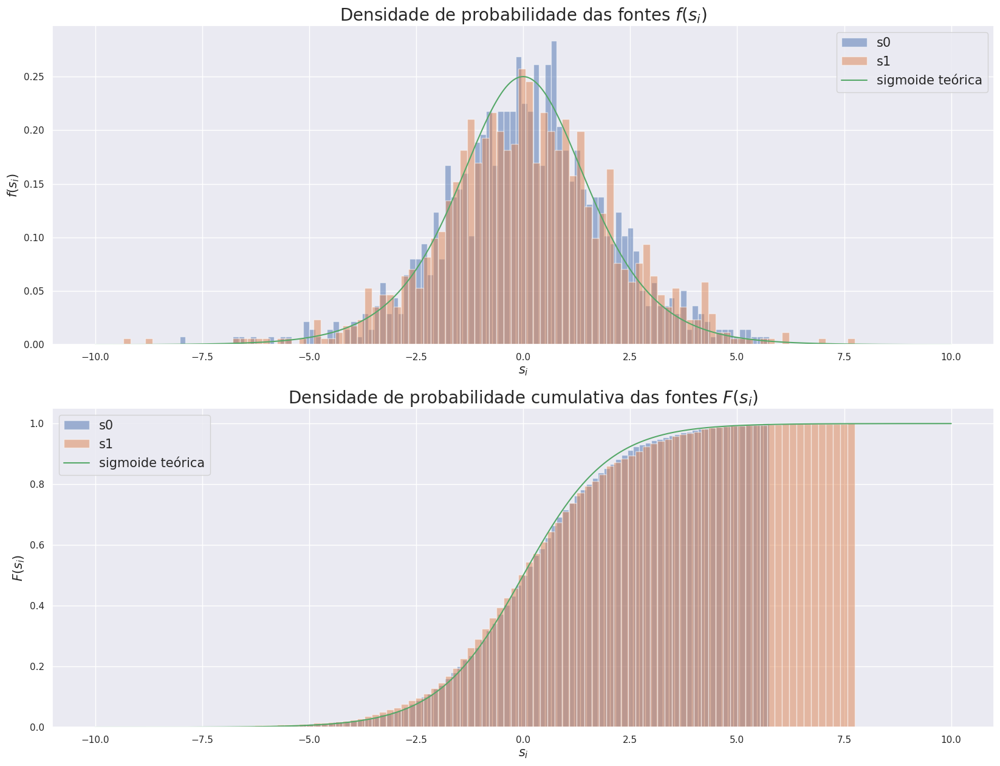

In [41]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)


for i in range(1, NSOURCES+1):
    ax1.hist(
        x=s[i-1,:],
        bins=100,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=s[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    
ax1.plot(
    np.linspace(-10,10,1000),
    [source_pdf(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)


ax2.plot(
    np.linspace(-10,10,1000),
    [source_cumulative(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)

ax1.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(s_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidade de probabilidade das fontes $f(s_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(s_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidade de probabilidade cumulativa das fontes $F(s_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.2. Mix sources and generate observations

In [42]:
# Mixing matrix
A = np.array([
    [1, 1],
    [-0.5, 0.5]
])
print('MIXING MATRIX A:')
print(A)

MIXING MATRIX A:
[[ 1.   1. ]
 [-0.5  0.5]]


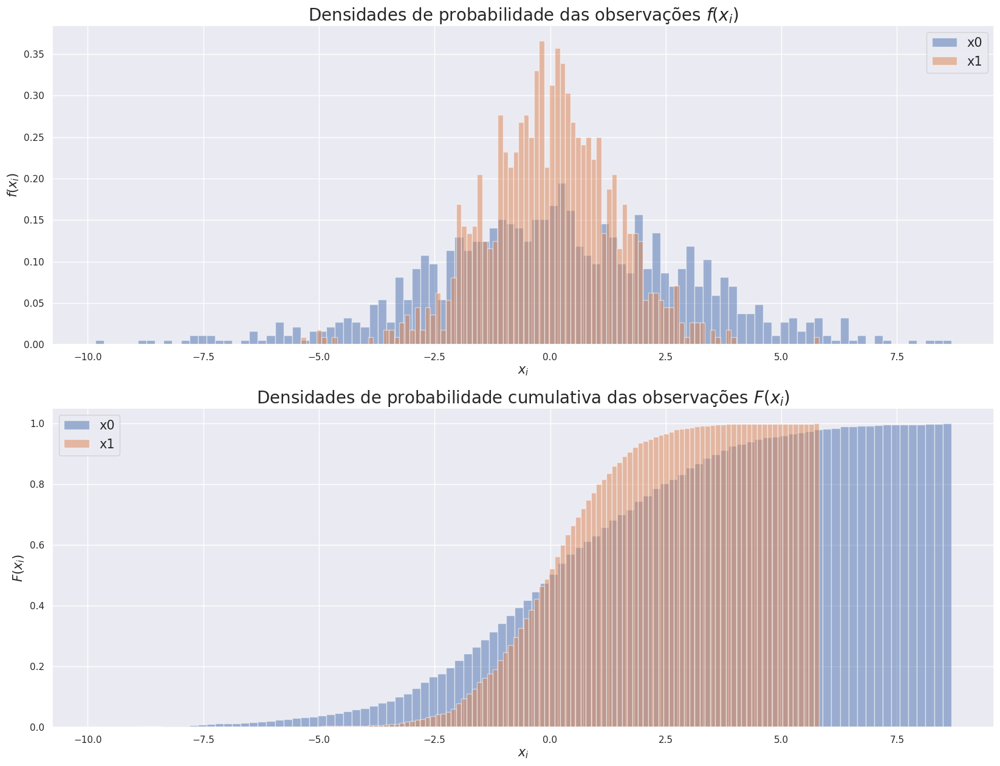

In [43]:
# Observed sources
x = A@s

fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)

for i in range(1, NSOURCES+1):
    ax1.hist(
        x=x[i-1,:],
        bins=100,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=x[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )

ax1.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(x_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidades de probabilidade das observações $f(x_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(x_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidades de probabilidade cumulativa das observações $F(x_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

In [12]:
if SAVE_SIGNALS:
    signal_save_dir = model_dir / 'signals'
    if not signal_save_dir.is_dir():
        signal_save_dir.mkdir()

    with (signal_save_dir / 'sources.pkl').open(mode='wb') as f:
        pickle.dump(s, f)

    with (signal_save_dir / 'mixtures.pkl').open(mode='wb') as f:
        pickle.dump(x, f)

## 2.3. Performance Curves - LIKELIHOOD

#### Prior:
#### $p(\boldsymbol{B})=cte$

In [44]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    return 1

## 1.3.1. Calculate Posteriori Grid

In [45]:
%%time

#############################
# CALCULATE POSTERIORI GRID #
#############################

# Create folder for combination of model specification + prior
combination_dir = model_dir / 'likelihood'
if CREATE_FOLDER_STRUCTURE:
    if not combination_dir.is_dir():
        combination_dir.mkdir()

if CALCULATE_GRID:
    # Initialize object used to obtain contour lines
    c_lines = PosteriorContourLines(
        u_lims=(-0.05, 0.05),
        v_lims=(-0.05, 0.05),
        n_points=CONTOUR_GRID_POINTS,
        central_point=(0,0)
    )
    
    # Evaluate posterior in neighborhood of true point
    c_lines.get_posteriori_neighborhood(
        A=A,
        x=x,
        N=NOBS,
        source_pdf_fn=source_pdf,
        prior_pdf_fn=prior_pdf,
        njobs=os.cpu_count()-1
    )
    
    # Maximum a posteriori point
    c_lines.get_max_point()

    # Save artifact
    with (combination_dir / 'ContourLines.pkl').open('wb') as f:
        pickle.dump(c_lines, f)
else:
    # Read artifact
    with (combination_dir / 'ContourLines.pkl').open('rb') as f:
        c_lines=pickle.load(f)

----------------------------------------------------------------------------------------------------
Ponto de máximo: u=0.025, v=-0.05
----------------------------------------------------------------------------------------------------
CPU times: user 164 ms, sys: 5 ms, total: 169 ms
Wall time: 1.65 s


## 1.3.2. Sample from Posterior Distribution

In [15]:
%%time

######################################
# SAMPLE FROM POSTERIOR DISTRIBUTION #
######################################

if EXECUTE_SAMPLING:
    # Fixate arguments in log posteriori fn
    wrapper_posteriori_fn = functools.partial(
        log_posteriori_fn,
        x,
        source_pdf,
        prior_pdf
    )
    
    # Fixate arguments in proposal_fn
    wrapper_proposal_fn = functools.partial(
        proposal_fn,
        EXPLORATION_VAR
    )
    
    # Initialize MH estimator
    estimator = MMSEMetropolisHastingsEstimator(
        n_samples=N_SAMPLES,
        log_posterior_fn=wrapper_posteriori_fn,
        Q=wrapper_proposal_fn,
        burn_in=BURN_IN
    )
    
    # Execute MCMC estimation
    estimator.fit(
        s,
        x,
        initial_condition=np.array([
            np.linalg.inv(A)
        ]).reshape((A.shape[0], A.shape[-1], 1)),
        n_jobs=N_WORKERS
    )

    # Save artifact
    with (combination_dir / 'MH_Estimator.pkl').open('wb') as f:
        pickle.dump(estimator, f)
else:
    # Read artifact
    with (combination_dir / 'MH_Estimator.pkl').open('rb') as f:
        estimator=pickle.load(f)

# 

CPU times: user 31 ms, sys: 106 ms, total: 137 ms
Wall time: 38.2 s


In [16]:
# Parse estimator object
analyzed_model_idx = 0
B_est = estimator.mcmc_results[analyzed_model_idx]['B_est']
s_est = B_est@x
samples = estimator.mcmc_results[analyzed_model_idx]['samples']
valid_samples = estimator.mcmc_results[analyzed_model_idx]['valid_samples']
logs = estimator.mcmc_results[analyzed_model_idx]['logs']

## 1.3.3. Plot 2D Contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (contour lines)
----------------------------------------------------------------------------------------------------


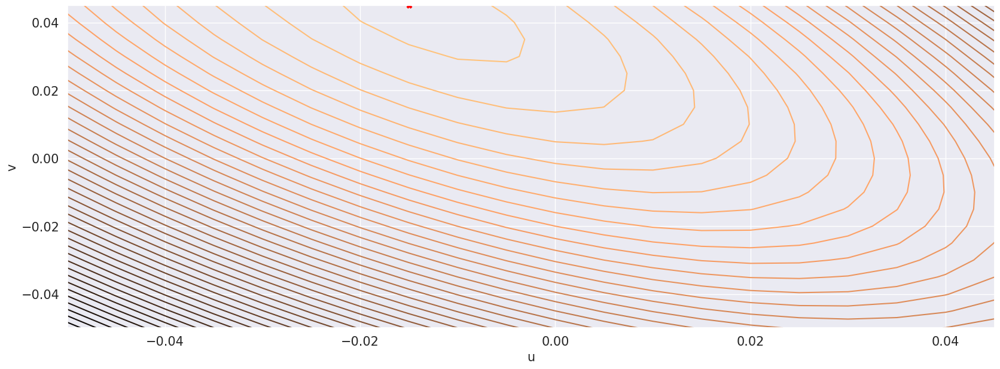

In [17]:
# 2-D Contour Lines
ContourLineGraphPlotter.plot_2D_contours(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid,
    max_post_point=c_lines.max_post_point
)

## 1.3.4. Plot interactive 3D

In [18]:
# 3-D Interactive plot
ContourLineGraphPlotter.plot_3D_interactive(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid
)

### 1.3.5. Plot sampled coefficients stochastic process - Markov Chain evolution

----------------------------------------------------------------------------------------------------
Evolution of sampled coefficients
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


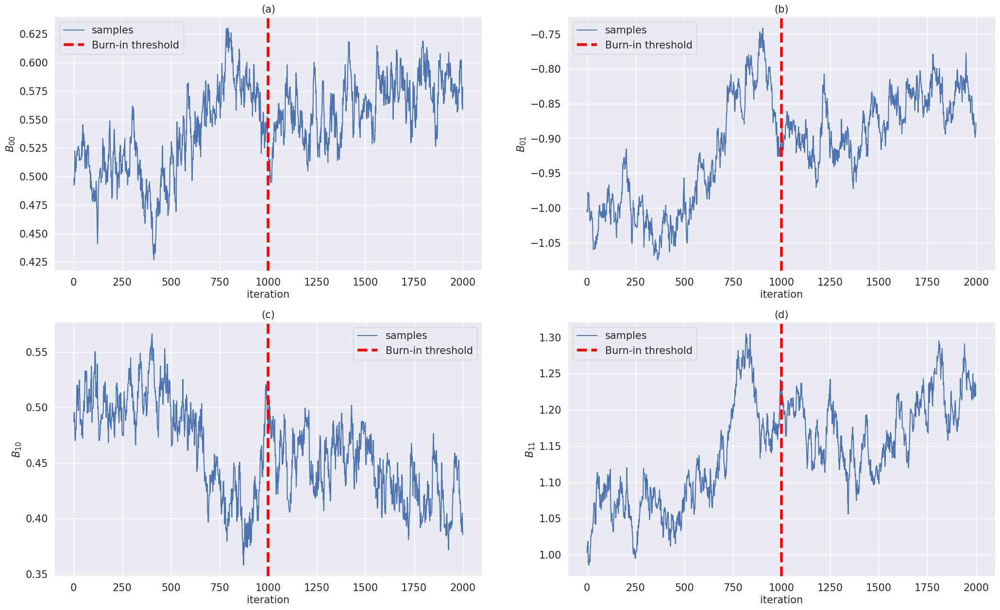

In [19]:
MCMCGraphPlotter.evolution_of_sampled_coefficients(
    samples=samples,
    estimator=estimator,
    logs=logs,
    save_dir=combination_dir if SAVE_GRAPHS else None
)

### 1.3.6. Plot Marginal Posteriors for Coefficients - Post-burn-in

----------------------------------------------------------------------------------------------------
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


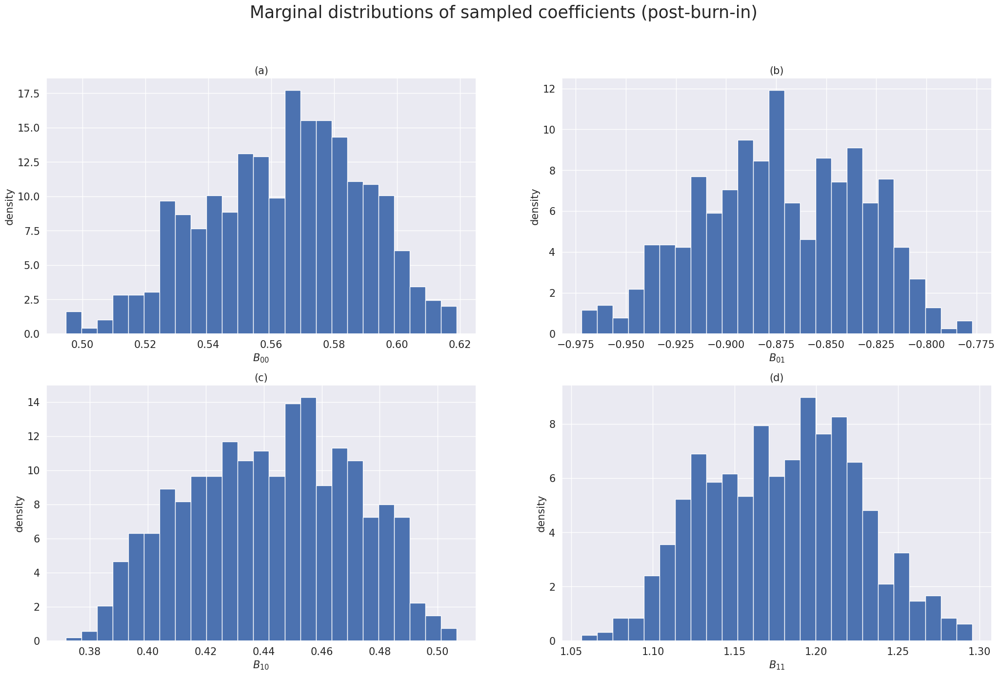

In [20]:
MCMCGraphPlotter.steady_state_marginal_distributions(
    valid_samples=valid_samples,
    nbins=NBINS,
    B_est=B_est,
    save_dir=combination_dir if SAVE_GRAPHS else None,
    plot_estimate=False
)

## 1.4. Performance Curves - determinant prior
#### Prior:
#### $p(\boldsymbol{B}) \varpropto \exp \left[ -\frac{1}{2 \sigma^{2}} (det(\boldsymbol{B}) - 1)^2 \right]$

In [21]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

In [22]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

def log_posteriori_fn(
    x,
    source_pdf_fn,
    prior_pdf_fn,
    B
):
    NOBS=x.shape[-1]
    
    # Cálculo de posteriori para registros
    posteriori = NOBS*np.log(np.abs(np.linalg.det(B)))
    y=B@x
    for i, j in np.ndindex(x.shape):
        posteriori += np.log(source_pdf(y[i,j]))
    posteriori += np.log(prior_pdf(B))

    return posteriori

def proposal_fn(
    exploration_var,
    B
):
    # Calculate shift in parameter
    shift = np.random.normal(
        loc=0,
        scale=np.sqrt(exploration_var),
        size=B.shape
    )

    # Sum shift to obtain new parameter value
    new_B = np.add(
        B, shift
    )

    return new_B

### 1.4.1. Calculate Posteriori Grid

In [23]:
%%time

#############################
# CALCULATE POSTERIORI GRID #
#############################

# Create folder for combination of model specification + prior
combination_dir = model_dir / 'determinant_prior'
if CREATE_FOLDER_STRUCTURE:
    if not combination_dir.is_dir():
        combination_dir.mkdir()

if CALCULATE_GRID:
    # Initialize object used to obtain contour lines
    c_lines = PosteriorContourLines(
        u_lims=(-0.05, 0.05),
        v_lims=(-0.05, 0.05),
        n_points=CONTOUR_GRID_POINTS,
        central_point=(0,0)
    )
    
    # Evaluate posterior in neighborhood of true point
    c_lines.get_posteriori_neighborhood(
        A=A,
        x=x,
        N=NOBS,
        source_pdf_fn=source_pdf,
        prior_pdf_fn=prior_pdf,
        njobs=os.cpu_count()-1
    )
    
    # Maximum a posteriori point
    c_lines.get_max_point()

    # Save artifact
    with (combination_dir / 'ContourLines.pkl').open('wb') as f:
        pickle.dump(c_lines, f)
else:
    # Read artifact
    with (combination_dir / 'ContourLines.pkl').open('rb') as f:
        c_lines=pickle.load(f)

----------------------------------------------------------------------------------------------------
Ponto de máximo: u=-0.01, v=0.035
----------------------------------------------------------------------------------------------------
CPU times: user 136 ms, sys: 5.92 ms, total: 142 ms
Wall time: 1.36 s


### 1.4.2. Sample from Posterior Distribution

In [24]:
%%time

######################################
# SAMPLE FROM POSTERIOR DISTRIBUTION #
######################################

if EXECUTE_SAMPLING:
    # Fixate arguments in log posteriori fn
    wrapper_posteriori_fn = functools.partial(
        log_posteriori_fn,
        x,
        source_pdf,
        prior_pdf
    )
    
    # Fixate arguments in proposal_fn
    wrapper_proposal_fn = functools.partial(
        proposal_fn,
        EXPLORATION_VAR
    )
    
    # Initialize MH estimator
    estimator = MMSEMetropolisHastingsEstimator(
        n_samples=N_SAMPLES,
        log_posterior_fn=wrapper_posteriori_fn,
        Q=wrapper_proposal_fn,
        burn_in=BURN_IN
    )
    
    # Execute MCMC estimation
    estimator.fit(
        s,
        x,
        initial_condition=np.array([
            np.linalg.inv(A)
        ]).reshape((A.shape[0], A.shape[-1], 1)),
        n_jobs=N_WORKERS
    )

    # Save artifact
    with (combination_dir / 'MH_Estimator.pkl').open('wb') as f:
        pickle.dump(estimator, f)
else:
    # Read artifact
    with (combination_dir / 'MH_Estimator.pkl').open('rb') as f:
        estimator=pickle.load(f)

# 

CPU times: user 54.3 ms, sys: 56.3 ms, total: 111 ms
Wall time: 41.4 s


In [25]:
# Parse estimator object
analyzed_model_idx = 0
B_est = estimator.mcmc_results[analyzed_model_idx]['B_est']
s_est = B_est@x
samples = estimator.mcmc_results[analyzed_model_idx]['samples']
valid_samples = estimator.mcmc_results[analyzed_model_idx]['valid_samples']
logs = estimator.mcmc_results[analyzed_model_idx]['logs']

### 1.4.3. Plot 2D Contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (contour lines)
----------------------------------------------------------------------------------------------------


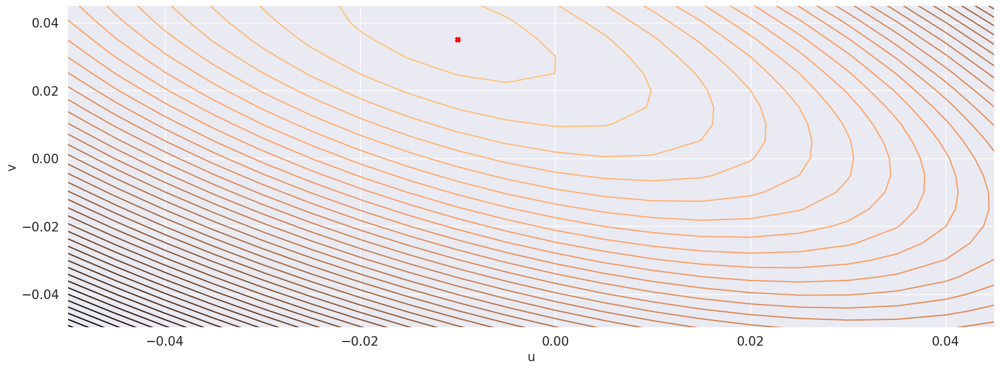

In [26]:
# 2-D Contour Lines
ContourLineGraphPlotter.plot_2D_contours(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid,
    max_post_point=c_lines.max_post_point
)

### 1.4.4. Plot interactive 3D

In [27]:
# 3-D Interactive plot
ContourLineGraphPlotter.plot_3D_interactive(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid
)

### 1.4.5. Plot sampled coefficients stochastic process - Markov Chain evolution

----------------------------------------------------------------------------------------------------
Evolution of sampled coefficients
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


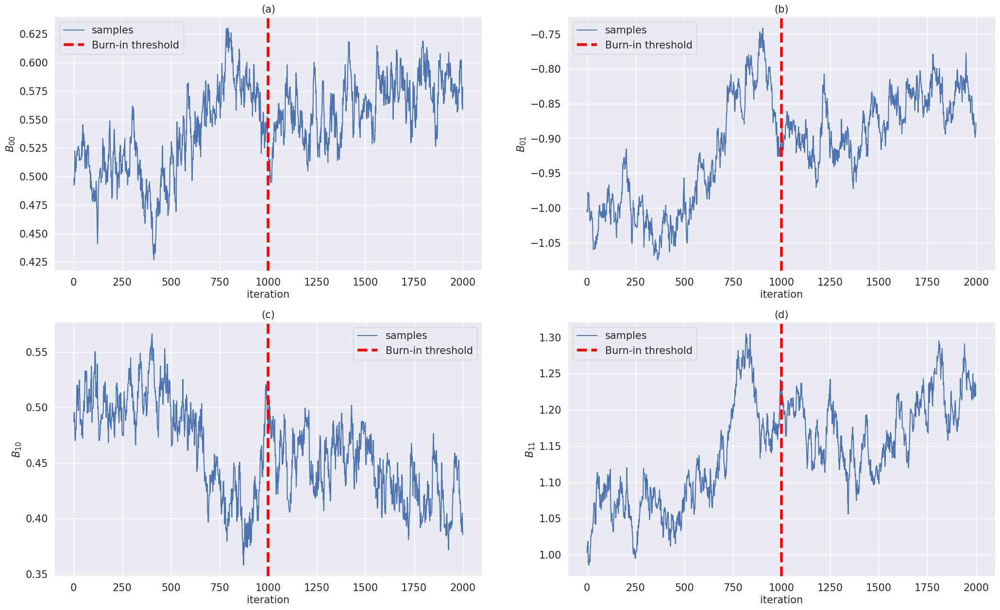

In [28]:
MCMCGraphPlotter.evolution_of_sampled_coefficients(
    samples=samples,
    estimator=estimator,
    logs=logs,
    save_dir=combination_dir if SAVE_GRAPHS else None
)

### 1.4.6. Plot Marginal Posteriors for Coefficients - Post-burn-in

----------------------------------------------------------------------------------------------------
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


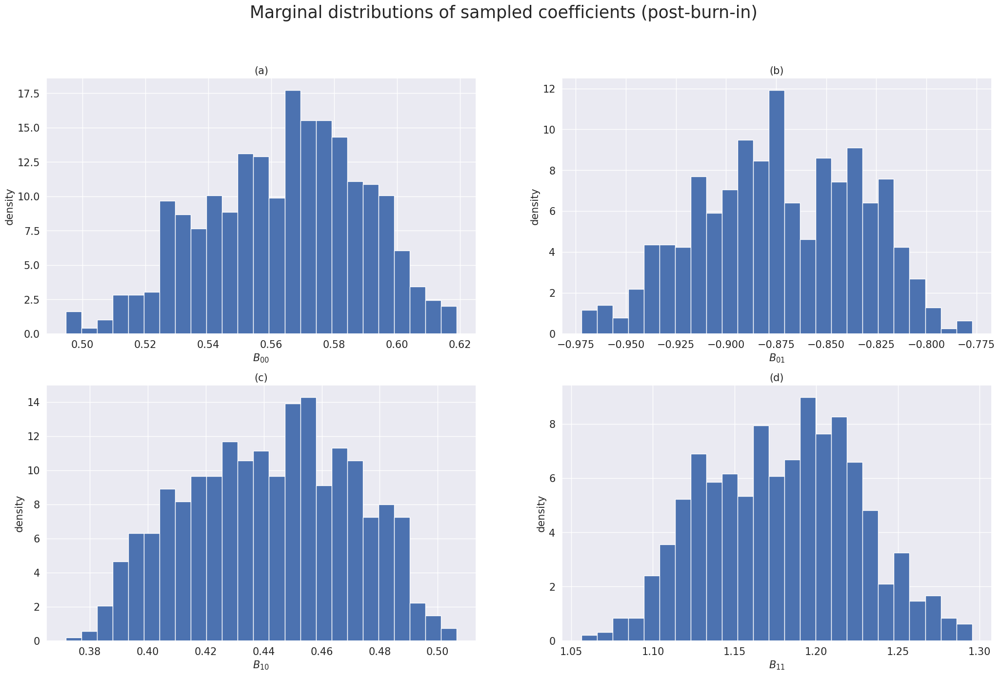

In [29]:
MCMCGraphPlotter.steady_state_marginal_distributions(
    valid_samples=valid_samples,
    nbins=NBINS,
    B_est=B_est,
    save_dir=combination_dir if SAVE_GRAPHS else None,
    plot_estimate=False
)

## 1.5. MAP - near-identity transformation
#### Prior:
#### $p(\boldsymbol{B}) \varpropto \exp \left[ -\frac{1}{2 \sigma^{2}} ||\boldsymbol{B} - \boldsymbol{I}||^2 \right]$

In [30]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(X):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.linalg.norm(X-np.eye(X.shape[0]))
    )

### 1.5.1. Calculate Posteriori Grid

In [31]:
%%time

#############################
# CALCULATE POSTERIORI GRID #
#############################

# Create folder for combination of model specification + prior
combination_dir = model_dir / 'identity_transform'
if CREATE_FOLDER_STRUCTURE:
    if not combination_dir.is_dir():
        combination_dir.mkdir()

if CALCULATE_GRID:
    # Initialize object used to obtain contour lines
    c_lines = PosteriorContourLines(
        u_lims=(-0.05, 0.05),
        v_lims=(-0.05, 0.05),
        n_points=CONTOUR_GRID_POINTS,
        central_point=(0,0)
    )
    
    # Evaluate posterior in neighborhood of true point
    c_lines.get_posteriori_neighborhood(
        A=A,
        x=x,
        N=NOBS,
        source_pdf_fn=source_pdf,
        prior_pdf_fn=prior_pdf,
        njobs=os.cpu_count()-1
    )
    
    # Maximum a posteriori point
    c_lines.get_max_point()

    # Save artifact
    with (combination_dir / 'ContourLines.pkl').open('wb') as f:
        pickle.dump(c_lines, f)
else:
    # Read artifact
    with (combination_dir / 'ContourLines.pkl').open('rb') as f:
        c_lines=pickle.load(f)

----------------------------------------------------------------------------------------------------
Ponto de máximo: u=-0.025, v=0.045
----------------------------------------------------------------------------------------------------
CPU times: user 163 ms, sys: 8.18 ms, total: 171 ms
Wall time: 1.53 s


### 1.5.2. Sample from Posterior Distribution

In [32]:
%%time

######################################
# SAMPLE FROM POSTERIOR DISTRIBUTION #
######################################

if EXECUTE_SAMPLING:
    # Fixate arguments in log posteriori fn
    wrapper_posteriori_fn = functools.partial(
        log_posteriori_fn,
        x,
        source_pdf,
        prior_pdf
    )
    
    # Fixate arguments in proposal_fn
    wrapper_proposal_fn = functools.partial(
        proposal_fn,
        EXPLORATION_VAR
    )
    
    # Initialize MH estimator
    estimator = MMSEMetropolisHastingsEstimator(
        n_samples=N_SAMPLES,
        log_posterior_fn=wrapper_posteriori_fn,
        Q=wrapper_proposal_fn,
        burn_in=BURN_IN
    )
    
    # Execute MCMC estimation
    estimator.fit(
        s,
        x,
        initial_condition=np.array([
            np.linalg.inv(A)
        ]).reshape((A.shape[0], A.shape[-1], 1)),
        n_jobs=N_WORKERS
    )

    # Save artifact
    with (combination_dir / 'MH_Estimator.pkl').open('wb') as f:
        pickle.dump(estimator, f)
else:
    # Read artifact
    with (combination_dir / 'MH_Estimator.pkl').open('rb') as f:
        estimator=pickle.load(f)

# 

CPU times: user 44.3 ms, sys: 65 ms, total: 109 ms
Wall time: 39.1 s


In [33]:
# Parse estimator object
analyzed_model_idx = 0
B_est = estimator.mcmc_results[analyzed_model_idx]['B_est']
s_est = B_est@x
samples = estimator.mcmc_results[analyzed_model_idx]['samples']
valid_samples = estimator.mcmc_results[analyzed_model_idx]['valid_samples']
logs = estimator.mcmc_results[analyzed_model_idx]['logs']

### 1.5.3. Plot 2D Contours

----------------------------------------------------------------------------------------------------
Normalized log-posterior (contour lines)
----------------------------------------------------------------------------------------------------


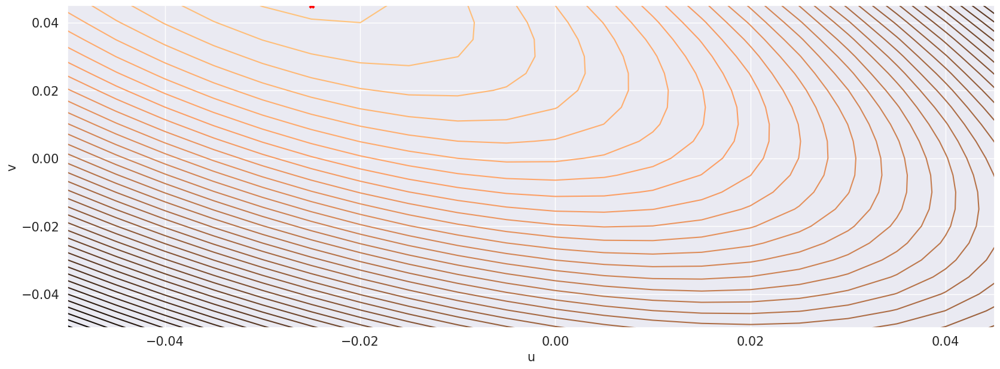

In [34]:
# 2-D Contour Lines
ContourLineGraphPlotter.plot_2D_contours(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid,
    max_post_point=c_lines.max_post_point
)

### 1.5.4. Plot interactive 3D

In [35]:
# 3-D Interactive plot
ContourLineGraphPlotter.plot_3D_interactive(
    u_vec=c_lines.u_vec,
    v_vec=c_lines.v_vec,
    z=c_lines.posterior_grid
)

### 1.5.5. Plot sampled coefficients stochastic process - Markov Chain evolution

----------------------------------------------------------------------------------------------------
Evolution of sampled coefficients
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


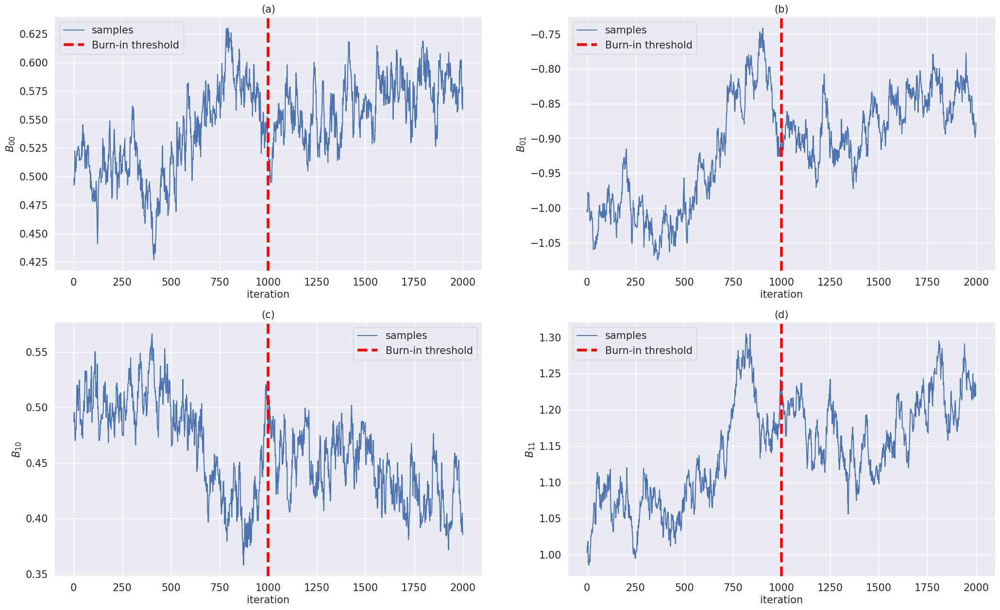

In [36]:
MCMCGraphPlotter.evolution_of_sampled_coefficients(
    samples=samples,
    estimator=estimator,
    logs=logs,
    save_dir=combination_dir if SAVE_GRAPHS else None
)

### 1.5.6. Plot Marginal Posteriors for Coefficients - Post-burn-in

----------------------------------------------------------------------------------------------------
(a) B00
(b) B01
(c) B10
(d) B11
----------------------------------------------------------------------------------------------------


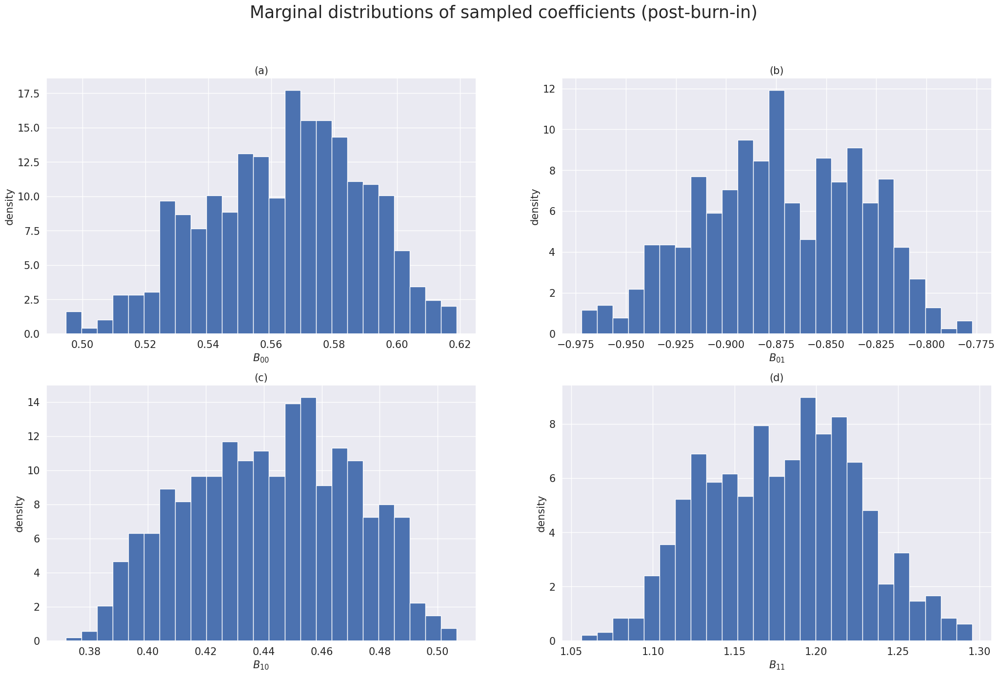

In [37]:
MCMCGraphPlotter.steady_state_marginal_distributions(
    valid_samples=valid_samples,
    nbins=NBINS,
    B_est=B_est,
    save_dir=combination_dir if SAVE_GRAPHS else None,
    plot_estimate=False
)

In [38]:
PAROU POURA

SyntaxError: invalid syntax (3395508541.py, line 1)

## 2.3. Performance Curves

In [ ]:
def get_posteriori_neighborhood(
    A,
    x,
    T,
    u_vec,
    v_vec,
    n_points,
    source_pdf_fn,
    prior_pdf_fn,
    njobs=1
):
    
    def __get_posteriori(
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn,
        idx_info
    ):
        i, u = idx_info[0]
        j, v = idx_info[-1]
        
        A_shifted = A + u*symmetric_basis + v*skew_symmetric_basis
        
        B = np.linalg.inv(A_shifted)
        
        likelihood = np.log(np.abs(np.linalg.det(B)))
        
        likelihood_iterator = [
            (t,i) for t,i in itertools.product(
                range(x.shape[-1]),
                range(x.shape[0]))
        ]

        s_est = B@x

        likelihood += (1/T)*np.sum([
            np.log(source_pdf_fn(s_est[i,t])) for t,i in likelihood_iterator
        ])
        
        prior = np.log(prior_pdf_fn(B))/T
        
        return {
            'i': i,
            'j': j,
            'log_posteriori': likelihood + prior
        }
        

    symmetric_basis = np.array([
        [0, 1],
        [1, 0]
    ])

    skew_symmetric_basis = np.array([
        [0, -1],
        [1, 0]
    ])
    
    iterator = itertools.product(
        enumerate(u_vec),
        enumerate(v_vec)
    )
    # it = [x for x in iterator]
    
    exec_fn = partial(
        __get_posteriori,
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn
    )
    
    z = np.empty(
        shape=(
            u_vec.shape[0],
            v_vec.shape[0]
        )
    )
    with pathos.multiprocessing.ProcessingPool(njobs) as p:
        results = p.map(exec_fn, iterator)
    
    for r in results:
        i=r['i']
        j=r['j']
        z[i, j]=r['log_posteriori']
    
    return z

### 2.3.1. Likelihood

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    return 1

In [ ]:
%%time

u_lims = (-0.3, 0.3)
v_lims = (-0.3, 0.3)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])


def prior_pdf(X):
    """
        This method takes VECTOR value X and return SCALAR prior pdf evaluated at X.
    """
    return 1

def prior_pdf_derivative(X):
    """
        This method takes VECTOR value x and return VECTOR prior pdf derivative evaluated at X.
    """
    return np.zeros(
        shape=X.shape
    )

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

### 2.3.2. MAP - determinant equal to one

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

In [ ]:
%%time

u_lims = (-0.3, 0.3)
v_lims = (-0.3, 0.3)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(X)-desired_det)/(2*np.square(sig)))

def prior_pdf_derivative(X):
    sig=0.1
    return -1*prior_pdf(X)*(np.linalg.det(X)-1)/np.square(sig)

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

## 2.3.3. MAP - near-identity transformation

In [ ]:
def source_pdf(x):
    return 0.5*np.exp(-np.abs(x))
    # return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.square(np.linalg.norm(B-np.eye(B.shape[0])))
    )

In [ ]:
%%time

u_lims = (-0.5, 0.5)
v_lims = (-0.5, 0.5)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
max_post_point

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.linalg.norm(X-np.eye(X.shape[0]))
    )

def prior_pdf_derivative(X):
    sig=0.1
    der_X=np.empty(X.shape)
    I=np.eye(X.shape[0])
    for i, j in np.ndindex(X.shape):
        der_X[i, j] = prior_pdf(X)*(-1/np.square(sig))*(X[i,j]-I[i,j])
    return der_X

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

# 3. MORE MISSPECIFIED MODEL

## 3.1. Initialize Sources

In [ ]:
def source_cumulative(x):
    return 1/(1+np.exp(-x))

def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def source_generator(
    nsources,
    nobs,
    mu,
    scale
):
    return np.random.logistic(
        loc=mu,
        scale=scale,
        size=(nsources, nobs)
    )

In [ ]:
NSOURCES=2
NOBS=7500
MU=0.5
SCALE=1.5

s = source_generator(
    nsources=NSOURCES,
    nobs=NOBS,
    mu=MU,
    scale=SCALE
)

print('-'*100)
print('NÚMERO DE FONTES: {}'.format(NSOURCES))
print('TAMANHO DOS SINAIS DAS FONTES: {}'.format(NOBS))
for i in range(s.shape[0]):
    print(
        'CURTOSE s{}: {}'.format(
            i,
            st.kurtosis(a=s[i,:])
        )
    )
    
print('-'*100)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)


for i in range(1, NSOURCES+1):
    ax1.hist(
        x=s[i-1,:],
        bins=100,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=s[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    
ax1.plot(
    np.linspace(-10,10,1000),
    [source_pdf(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)


ax2.plot(
    np.linspace(-10,10,1000),
    [source_cumulative(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)

ax1.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(s_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidade de probabilidade das fontes $f(s_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(s_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidade de probabilidade cumulativa das fontes $F(s_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.2. Mix sources and generate observations

In [ ]:
# Mixing matrix
A = np.array([
    [1, 1],
    [-0.5, 0.5]
])
print('MIXING MATRIX A:')
print(A)

In [ ]:
# Observed sources
x = A@s

fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)

for i in range(1, NSOURCES+1):
    ax1.hist(
        x=x[i-1,:],
        bins=100,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=x[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )

ax1.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(x_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidades de probabilidade das observações $f(x_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(x_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidades de probabilidade cumulativa das observações $F(x_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.3. Performance Curves

In [ ]:
def get_posteriori_neighborhood(
    A,
    x,
    T,
    u_vec,
    v_vec,
    n_points,
    source_pdf_fn,
    prior_pdf_fn,
    njobs=1
):
    
    def __get_posteriori(
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn,
        idx_info
    ):
        i, u = idx_info[0]
        j, v = idx_info[-1]
        
        A_shifted = A + u*symmetric_basis + v*skew_symmetric_basis
        
        B = np.linalg.inv(A_shifted)
        
        likelihood = np.log(np.abs(np.linalg.det(B)))
        
        likelihood_iterator = [
            (t,i) for t,i in itertools.product(
                range(x.shape[-1]),
                range(x.shape[0]))
        ]

        s_est = B@x

        likelihood += (1/T)*np.sum([
            np.log(source_pdf_fn(s_est[i,t])) for t,i in likelihood_iterator
        ])
        
        prior = np.log(prior_pdf_fn(B))/T
        
        return {
            'i': i,
            'j': j,
            'log_posteriori': likelihood + prior
        }
        

    symmetric_basis = np.array([
        [0, 1],
        [1, 0]
    ])

    skew_symmetric_basis = np.array([
        [0, -1],
        [1, 0]
    ])
    
    iterator = itertools.product(
        enumerate(u_vec),
        enumerate(v_vec)
    )
    # it = [x for x in iterator]
    
    exec_fn = partial(
        __get_posteriori,
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn
    )
    
    z = np.empty(
        shape=(
            u_vec.shape[0],
            v_vec.shape[0]
        )
    )
    with pathos.multiprocessing.ProcessingPool(njobs) as p:
        results = p.map(exec_fn, iterator)
    
    for r in results:
        i=r['i']
        j=r['j']
        z[i, j]=r['log_posteriori']
    
    return z

### 2.3.1. Likelihood

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    return 1

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])


def prior_pdf(X):
    """
        This method takes VECTOR value X and return SCALAR prior pdf evaluated at X.
    """
    return 1

def prior_pdf_derivative(X):
    """
        This method takes VECTOR value x and return VECTOR prior pdf derivative evaluated at X.
    """
    return np.zeros(
        shape=X.shape
    )

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

### 2.3.2. MAP - determinant equal to one

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(X)-desired_det)/(2*np.square(sig)))

def prior_pdf_derivative(X):
    sig=0.1
    return -1*prior_pdf(X)*(np.linalg.det(X)-1)/np.square(sig)

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

## 2.3.3. MAP - near-identity transformation

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.square(np.linalg.norm(B-np.eye(B.shape[0])))
    )

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.linalg.norm(X-np.eye(X.shape[0]))
    )

def prior_pdf_derivative(X):
    sig=0.1
    der_X=np.empty(X.shape)
    I=np.eye(X.shape[0])
    for i, j in np.ndindex(X.shape):
        der_X[i, j] = prior_pdf(X)*(-1/np.square(sig))*(X[i,j]-I[i,j])
    return der_X

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

# 4. LARGELY MISSPECIFIED MODEL - SUPERGAUSSIAN

## 3.1. Initialize Sources

In [ ]:
def source_cumulative(x):
    return 1/(1+np.exp(-x))

def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def source_generator(
    nsources,
    nobs,
    mu,
    scale
):
    return np.random.laplace(
        loc=mu,
        scale=scale,
        size=(nsources, nobs)
    )

In [ ]:
NSOURCES=2
NOBS=7500
MU=0
SCALE=1

s = source_generator(
    nsources=NSOURCES,
    nobs=NOBS,
    mu=MU,
    scale=SCALE
)

print('-'*100)
print('NÚMERO DE FONTES: {}'.format(NSOURCES))
print('TAMANHO DOS SINAIS DAS FONTES: {}'.format(NOBS))
for i in range(s.shape[0]):
    print(
        'CURTOSE s{}: {}'.format(
            i,
            st.kurtosis(a=s[i,:])
        )
    )
    
print('-'*100)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)


for i in range(1, NSOURCES+1):
    ax1.hist(
        x=s[i-1,:],
        bins=100,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=s[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    
ax1.plot(
    np.linspace(-10,10,1000),
    [source_pdf(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)


ax2.plot(
    np.linspace(-10,10,1000),
    [source_cumulative(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)

ax1.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(s_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidade de probabilidade das fontes $f(s_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(s_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidade de probabilidade cumulativa das fontes $F(s_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.2. Mix sources and generate observations

In [ ]:
# Mixing matrix
A = np.array([
    [1, 1],
    [-0.5, 0.5]
])
print('MIXING MATRIX A:')
print(A)

In [ ]:
# Observed sources
x = A@s

fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)

for i in range(1, NSOURCES+1):
    ax1.hist(
        x=x[i-1,:],
        bins=100,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=x[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )

ax1.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(x_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidades de probabilidade das observações $f(x_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(x_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidades de probabilidade cumulativa das observações $F(x_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.3. Performance Curves

In [ ]:
def get_posteriori_neighborhood(
    A,
    x,
    T,
    u_vec,
    v_vec,
    n_points,
    source_pdf_fn,
    prior_pdf_fn,
    njobs=1
):
    
    def __get_posteriori(
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn,
        idx_info
    ):
        i, u = idx_info[0]
        j, v = idx_info[-1]
        
        A_shifted = A + u*symmetric_basis + v*skew_symmetric_basis
        
        B = np.linalg.inv(A_shifted)
        
        likelihood = np.log(np.abs(np.linalg.det(B)))
        
        likelihood_iterator = [
            (t,i) for t,i in itertools.product(
                range(x.shape[-1]),
                range(x.shape[0]))
        ]

        s_est = B@x

        likelihood += (1/T)*np.sum([
            np.log(source_pdf_fn(s_est[i,t])) for t,i in likelihood_iterator
        ])
        
        prior = np.log(prior_pdf_fn(B))/T
        
        return {
            'i': i,
            'j': j,
            'log_posteriori': likelihood + prior
        }
        

    symmetric_basis = np.array([
        [0, 1],
        [1, 0]
    ])

    skew_symmetric_basis = np.array([
        [0, -1],
        [1, 0]
    ])
    
    iterator = itertools.product(
        enumerate(u_vec),
        enumerate(v_vec)
    )
    # it = [x for x in iterator]
    
    exec_fn = partial(
        __get_posteriori,
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn
    )
    
    z = np.empty(
        shape=(
            u_vec.shape[0],
            v_vec.shape[0]
        )
    )
    with pathos.multiprocessing.ProcessingPool(njobs) as p:
        results = p.map(exec_fn, iterator)
    
    for r in results:
        i=r['i']
        j=r['j']
        z[i, j]=r['log_posteriori']
    
    return z

### 2.3.1. Likelihood

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    return 1

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])


def prior_pdf(X):
    """
        This method takes VECTOR value X and return SCALAR prior pdf evaluated at X.
    """
    return 1

def prior_pdf_derivative(X):
    """
        This method takes VECTOR value x and return VECTOR prior pdf derivative evaluated at X.
    """
    return np.zeros(
        shape=X.shape
    )

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

### 2.3.2. MAP - determinant equal to one

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(X)-desired_det)/(2*np.square(sig)))

def prior_pdf_derivative(X):
    sig=0.1
    return -1*prior_pdf(X)*(np.linalg.det(X)-1)/np.square(sig)

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

## 2.3.3. MAP - near-identity transformation

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.square(np.linalg.norm(B-np.eye(B.shape[0])))
    )

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.linalg.norm(X-np.eye(X.shape[0]))
    )

def prior_pdf_derivative(X):
    sig=0.1
    der_X=np.empty(X.shape)
    I=np.eye(X.shape[0])
    for i, j in np.ndindex(X.shape):
        der_X[i, j] = prior_pdf(X)*(-1/np.square(sig))*(X[i,j]-I[i,j])
    return der_X

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

# 4. LARGELY MISSPECIFIED MODEL - SUBGAUSSIAN

## 3.1. Initialize Sources

In [ ]:
def source_cumulative(x):
    return 1/(1+np.exp(-x))

def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def source_generator(
    nsources,
    nobs,
    mu,
    scale
):
    return np.random.triangular(
        left=-2,
        mode=0,
        right=2,
        size=(nsources, nobs)
    )

In [ ]:
NSOURCES=2
NOBS=7500
MU=0
SCALE=1

s = source_generator(
    nsources=NSOURCES,
    nobs=NOBS,
    mu=MU,
    scale=SCALE
)

print('-'*100)
print('NÚMERO DE FONTES: {}'.format(NSOURCES))
print('TAMANHO DOS SINAIS DAS FONTES: {}'.format(NOBS))
for i in range(s.shape[0]):
    print(
        'CURTOSE s{}: {}'.format(
            i,
            st.kurtosis(a=s[i,:])
        )
    )
    
print('-'*100)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)


for i in range(1, NSOURCES+1):
    ax1.hist(
        x=s[i-1,:],
        bins=100,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=s[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='s{}'.format(i-1),
        alpha=0.5
    )
    
ax1.plot(
    np.linspace(-10,10,1000),
    [source_pdf(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)


ax2.plot(
    np.linspace(-10,10,1000),
    [source_cumulative(x) for x in np.linspace(-10,10,1000)],
    label='sigmoide teórica'
)

ax1.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(s_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidade de probabilidade das fontes $f(s_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$s_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(s_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidade de probabilidade cumulativa das fontes $F(s_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.2. Mix sources and generate observations

In [ ]:
# Mixing matrix
A = np.array([
    [1, 1],
    [-0.5, 0.5]
])
print('MIXING MATRIX A:')
print(A)

In [ ]:
# Observed sources
x = A@s

fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)

for i in range(1, NSOURCES+1):
    ax1.hist(
        x=x[i-1,:],
        bins=100,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )
    ax2.hist(
        x=x[i-1,:],
        bins=100,
        cumulative=True,
        density=True,
        label='x{}'.format(i-1),
        alpha=0.5
    )

ax1.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax1.set_ylabel(
    '$f(x_{i})$',
    fontsize=15
)
ax1.set_title(
    'Densidades de probabilidade das observações $f(x_{i})$',
    fontsize=20
)

ax2.set_xlabel(
    '$x_{i}$',
    fontsize=15
)
ax2.set_ylabel(
    '$F(x_{i})$',
    fontsize=15
)
ax2.set_title(
    'Densidades de probabilidade cumulativa das observações $F(x_{i})$',
    fontsize=20
)

l1=ax1.legend(fontsize=15)
l2=ax2.legend(fontsize=15)

## 2.3. Performance Curves

In [ ]:
def get_posteriori_neighborhood(
    A,
    x,
    T,
    u_vec,
    v_vec,
    n_points,
    source_pdf_fn,
    prior_pdf_fn,
    njobs=1
):
    
    def __get_posteriori(
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn,
        idx_info
    ):
        i, u = idx_info[0]
        j, v = idx_info[-1]
        
        A_shifted = A + u*symmetric_basis + v*skew_symmetric_basis
        
        B = np.linalg.inv(A_shifted)
        
        likelihood = np.log(np.abs(np.linalg.det(B)))
        
        likelihood_iterator = [
            (t,i) for t,i in itertools.product(
                range(x.shape[-1]),
                range(x.shape[0]))
        ]

        s_est = B@x

        likelihood += (1/T)*np.sum([
            np.log(source_pdf_fn(s_est[i,t])) for t,i in likelihood_iterator
        ])
        
        prior = np.log(prior_pdf_fn(B))/T
        
        return {
            'i': i,
            'j': j,
            'log_posteriori': likelihood + prior
        }
        

    symmetric_basis = np.array([
        [0, 1],
        [1, 0]
    ])

    skew_symmetric_basis = np.array([
        [0, -1],
        [1, 0]
    ])
    
    iterator = itertools.product(
        enumerate(u_vec),
        enumerate(v_vec)
    )
    # it = [x for x in iterator]
    
    exec_fn = partial(
        __get_posteriori,
        A,
        x,
        T,
        source_pdf_fn,
        prior_pdf_fn
    )
    
    z = np.empty(
        shape=(
            u_vec.shape[0],
            v_vec.shape[0]
        )
    )
    with pathos.multiprocessing.ProcessingPool(njobs) as p:
        results = p.map(exec_fn, iterator)
    
    for r in results:
        i=r['i']
        j=r['j']
        z[i, j]=r['log_posteriori']
    
    return z

### 2.3.1. Likelihood

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    return 1

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])


def prior_pdf(X):
    """
        This method takes VECTOR value X and return SCALAR prior pdf evaluated at X.
    """
    return 1

def prior_pdf_derivative(X):
    """
        This method takes VECTOR value x and return VECTOR prior pdf derivative evaluated at X.
    """
    return np.zeros(
        shape=X.shape
    )

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

### 2.3.2. MAP - determinant equal to one

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(B)-desired_det)/(2*np.square(sig)))

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    desired_det=1
    return (1/np.sqrt(2*np.pi*np.square(sig)))*np.exp(-np.square(np.linalg.det(X)-desired_det)/(2*np.square(sig)))

def prior_pdf_derivative(X):
    sig=0.1
    return -1*prior_pdf(X)*(np.linalg.det(X)-1)/np.square(sig)

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))

## 2.3.3. MAP - near-identity transformation

In [ ]:
def source_pdf(x):
    return np.exp(-x)/np.square(1+np.exp(-x))

def prior_pdf(B):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.square(np.linalg.norm(B-np.eye(B.shape[0])))
    )

In [ ]:
%%time

u_lims = (-1, 1)
v_lims = (-1, 1)
n_points = 200

u_vec = np.linspace(u_lims[0], u_lims[-1], n_points)
v_vec = np.linspace(v_lims[0], v_lims[-1], n_points)

z = get_posteriori_neighborhood(
    A=A,
    x=x,
    T=NOBS,
    u_vec=u_vec,
    v_vec=v_vec,
    n_points=n_points,
    source_pdf_fn=source_pdf,
    prior_pdf_fn=prior_pdf,
    njobs=os.cpu_count()-1
)

In [ ]:
# Ponto de máximo
max_post_point = np.unravel_index(
    z.argmax(), 
    z.shape
)

#
max_post = z[max_post_point]

print('-'*100)
print('Ponto de máximo: u={}, v={}'.format(u_vec[max_post_point[0]], v_vec[max_post_point[1]]))
print('-'*100)

In [ ]:
# Plot de curvas de nível
fig = plt.figure(figsize=(20,7))

U, V = np.meshgrid(u_vec, v_vec)

plt.contour(
    U,
    V,
    z.T,
    levels=50,
    cmap='copper'
)

plt.scatter(
    u_vec[max_post_point[0]],
    v_vec[max_post_point[-1]],
    marker='X',
    color='red'
)

plt.xlabel(
    'u',
    fontsize=15
)
plt.ylabel(
    'v',
    fontsize=15
)

plt.title(
    'Log-posteriori normalizada (curvas de nível)',
    fontsize=15
)



In [ ]:
# Plot interativo
fig = go.Figure(
    go.Surface(
        x=u_vec,
        y=v_vec,
        z=z
    )
)

fig.update_layout(
    title='Log-posteriori normalizada (superfície)',
    autosize=False,
    width=500, height=500,
    scene=dict(
        xaxis_title='U',
        yaxis_title='V',
        zaxis_title='Log-posteriori',
    )
)
                 
fig.show()

In [ ]:
def source_pdf(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf evaluated at x.
    """
    return np.exp(-x)/np.square(1+np.exp(-x))


def source_pdf_derivative(x):
    """
        This method takes SCALAR value x and return SCALAR source pdf derivative evaluated at x.
    """
    return (2*np.exp(-2*x)*(1+np.exp(-x)) - np.exp(-x)*np.square(1+np.exp(-x)))/np.power([1+np.exp(-x)],[4])

def prior_pdf(X):
    sig=0.1
    return np.exp(
        (-1/2/np.square(sig))*np.linalg.norm(X-np.eye(X.shape[0]))
    )

def prior_pdf_derivative(X):
    sig=0.1
    der_X=np.empty(X.shape)
    I=np.eye(X.shape[0])
    for i, j in np.ndindex(X.shape):
        der_X[i, j] = prior_pdf(X)*(-1/np.square(sig))*(X[i,j]-I[i,j])
    return der_X

## 3.1. Standard Gradient

In [ ]:
# Initialize estimator
estimator = MAPGradientEstimator(
    learning_rate=learning_rate,
    thresh=thresh,
    max_it=max_it,
    source_pdf=source_pdf,
    source_pdf_derivative=source_pdf_derivative,
    prior_pdf=prior_pdf,
    prior_pdf_derivative=prior_pdf_derivative,
    is_natural_gradient=False
)

In [ ]:
%%time

# Run optimization
estimator.fit(
    s=s,
    x=x,
    initial_condition=initial_B,
    n_initializations=1,
    n_jobs=os.cpu_count()-1
)

# Parse results
B=estimator.fit_results[0]['unmixing_matrix']
logs=estimator.fit_results[0]['logs']

print('-'*100)
print('Total iterations: {}'.format(logs.shape[0]))
print('Final log-posteriori: {}'.format(logs.iloc[-1]['log_posteriori']))
print('-'*100)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='log_posteriori'
)
plt.title(
    'Evolução da prob. a posteriori ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
sns.lineplot(
    data=logs,
    x='iteration',
    y='detB'
)
plt.title(
    'Evolução do determinante de B ao longo das iterações',
    fontsize=15
)

In [ ]:
fig = plt.figure(figsize=(20,7))
for i, j in np.ndindex(B.shape):
    plt.plot(
        logs.iteration.values,
        [row['gradient'][i,j] for n, row in logs.iterrows()],
        label='deltaB[{},{}]'.format(i,j)
    )

plt.title(
    'Evolução da matriz de derivadas ao longo das iterações',
    fontsize=15
)
plt.legend()

In [ ]:
B

In [ ]:
np.linalg.inv(A)

In [ ]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, ncols=1,
    figsize=(20,15)
)
NPOINTS=100
PLOT_START=NOBS//2
PLOT_END=PLOT_START+NPOINTS

t=range(NOBS)
s_est = B@x

#Ax1
ax1.plot(
    t[PLOT_START:PLOT_END],
    s_est[0,PLOT_START:PLOT_END],
    label='$\hat{s}_{0}$',
    color='red',
    linestyle='--'
)
ax1.plot(
    t[PLOT_START:PLOT_END],
    s[0,PLOT_START:PLOT_END],
    label='$s_{0}$'
)
ax1.legend(fontsize=15)

#Ax2
ax2.plot(
    t[PLOT_START:PLOT_END],
    s_est[1,PLOT_START:PLOT_END],
    label='$\hat{s}_{1}$',
    color='red',
    linestyle='--'
)
ax2.plot(
    t[PLOT_START:PLOT_END],
    s[1,PLOT_START:PLOT_END],
    label='$s_{1}$'
)
ax2.legend(fontsize=15)



In [ ]:
# Error norm
print('Norma do erro de estimação: {}'.format(
np.linalg.norm(
    np.subtract(s,s_est)
)/np.size(s)))